In [1]:
import pandas as pd
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
# from statannot import add_stat_annotation
import numpy as np
from statannotations.Annotator import Annotator
import sctools as sct
import scanpy as sc
plt.style.use('meth.mplstyle')

2024-01-24 07:00:21.388 | ℹ️ Welcome to sctools! Stay white-pilled!

M       M   AAAAA   L       AAAAA  TTTTTTT   1
MM     MM  A     A  L      A     A    T      1
M M   M M  AAAAAAA  L      AAAAAAA    T      1
M  M M  M  A     A  L      A     A    T      1
M   M   M  A     A  LLLLL  A     A    T     111



In [2]:
ad = sct.io.read_adata('gs://retro-personal-andrei/scDNAm/scDNAm/data/GSE121364/GSE121364.h5ad')
ad

2024-01-24 07:00:22.178 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/data/GSE121364/GSE121364.h5ad', checksum='TsoontGdhuGEr+kHrrGO1A==')


AnnData object with n_obs × n_vars = 377 × 25952
    obs: 'Run', 'Assay Type', 'AvgSpotLen', 'Bases', 'BioProject', 'BioSample', 'Bytes', 'Center Name', 'Consent', 'DATASTORE filetype', 'DATASTORE provider', 'DATASTORE region', 'Experiment', 'GEO_Accession (exp)', 'Instrument', 'LibraryLayout', 'LibrarySelection', 'LibrarySource', 'Organism', 'Platform_x', 'ReleaseDate', 'Sample Name', 'SRA Study', 'Age', 'Cell_type', 'Mouse_ID', 'source_name', 'STRAIN', 'Accession', 'Title', 'Sample Type', 'Taxonomy', 'Channels', 'Platform_y', 'Series', 'Supplementary Types', 'Supplementary Links', 'SRA Accession', 'Contact', 'Release Date'
    var: 'chr', 'start'

In [3]:
ad.obs[ad.obs['Age'].values.isna()]

,Run,Assay Type,AvgSpotLen,Bases,BioProject,BioSample,Bytes,Center Name,Consent,DATASTORE filetype,...,Sample Type,Taxonomy,Channels,Platform_y,Series,Supplementary Types,Supplementary Links,SRA Accession,Contact,Release Date
Y7_TA_Hi_52,SRR8067478,RNA-Seq,150,146754900,PRJNA497128,SAMN10249798,55174911,GEO,public,"sra,fastq",...,SRA,Mus musculus,1,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895817,Felix Krueger,"Aug 14, 2019"
Y7_TA_Hi_53,SRR8067479,RNA-Seq,150,123945000,PRJNA497128,SAMN10249797,45358417,GEO,public,"sra,fastq",...,SRA,Mus musculus,1,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895818,Felix Krueger,"Aug 14, 2019"
Y7_TA_Hi_54,SRR8067480,RNA-Seq,150,112391250,PRJNA497128,SAMN10249796,41683570,GEO,public,"sra,fastq",...,SRA,Mus musculus,1,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895819,Felix Krueger,"Aug 14, 2019"


In [4]:
ad.obs.loc[ad.obs['Age'].isna(), 'Age'] = '2 months'

In [5]:
df_genes = pd.read_csv('orrs/Aggregated_by_genes_CpG2gene_table_minus_strand_proper_genes_at_least_3_CpGs_v3.csv', index_col=0)
# df_genes = pd.read_csv('orrs/Aggregated_by_genes_CpG2gene_table_plus_strand_proper_genes_at_least_3_CpGs_v3.csv')
df_genes.head()

,0.1_Num_of_CpGs_around,0.1_Num_of_CoReg_CpGs_around,0.1_Num_of_Stoch_CpGs_around,0.1_Num_of_Random_CpGs_around,0.2_Num_of_CpGs_around,0.2_Num_of_CoReg_CpGs_around,0.2_Num_of_Stoch_CpGs_around,0.2_Num_of_Random_CpGs_around,0.3_Num_of_CpGs_around,0.3_Num_of_CoReg_CpGs_around,...,0.6_Fraction_of_Random,0.7_Fraction_of_CoReg,0.7_Fraction_of_Stoch,0.7_Fraction_of_Random,0.8_Fraction_of_CoReg,0.8_Fraction_of_Stoch,0.8_Fraction_of_Random,0.9_Fraction_of_CoReg,0.9_Fraction_of_Stoch,0.9_Fraction_of_Random
geneName,,,,,,,,,,,,,,,,,,,,,
Lrriq1,5.0,4.0,0.0,1.0,5.0,4.0,0.0,1.0,5.0,3.0,...,0.200000,0.0,0.800000,0.200000,0.0,0.800000,0.200000,0.0,0.800000,0.200000
Tmtc2,5.0,2.0,1.0,2.0,5.0,2.0,1.0,2.0,5.0,2.0,...,0.400000,0.0,0.600000,0.400000,0.0,0.600000,0.400000,0.0,0.600000,0.400000
Otogl,5.0,2.0,1.0,2.0,5.0,2.0,1.0,2.0,5.0,0.0,...,0.400000,0.0,0.600000,0.400000,0.0,0.600000,0.400000,0.0,0.600000,0.400000
Grm1,4.0,0.0,2.0,2.0,4.0,0.0,2.0,2.0,4.0,0.0,...,0.500000,0.0,0.500000,0.500000,0.0,0.500000,0.500000,0.0,0.500000,0.500000
Syt1,9.0,4.0,1.0,4.0,9.0,4.0,1.0,4.0,9.0,3.0,...,0.444444,0.0,0.555556,0.444444,0.0,0.555556,0.444444,0.0,0.555556,0.444444


In [6]:
df = df_genes[['0.4_Fraction_of_Random', '0.4_Fraction_of_CoReg', '0.4_Fraction_of_Stoch']]

In [7]:
ad.var = pd.concat((ad.var, df), axis=1)

In [8]:
ad_coreg = ad[:,ad.var['0.4_Fraction_of_CoReg'] > 0.5].copy()
ad_stoch = ad[:,ad.var['0.4_Fraction_of_Stoch'] > 0.5].copy()
ad_random = ad[:,ad.var['0.4_Fraction_of_Random'] > 0.5].copy()
ad_coreg, ad_stoch, ad_random

(AnnData object with n_obs × n_vars = 377 × 41
     obs: 'Run', 'Assay Type', 'AvgSpotLen', 'Bases', 'BioProject', 'BioSample', 'Bytes', 'Center Name', 'Consent', 'DATASTORE filetype', 'DATASTORE provider', 'DATASTORE region', 'Experiment', 'GEO_Accession (exp)', 'Instrument', 'LibraryLayout', 'LibrarySelection', 'LibrarySource', 'Organism', 'Platform_x', 'ReleaseDate', 'Sample Name', 'SRA Study', 'Age', 'Cell_type', 'Mouse_ID', 'source_name', 'STRAIN', 'Accession', 'Title', 'Sample Type', 'Taxonomy', 'Channels', 'Platform_y', 'Series', 'Supplementary Types', 'Supplementary Links', 'SRA Accession', 'Contact', 'Release Date'
     var: 'chr', 'start', '0.4_Fraction_of_Random', '0.4_Fraction_of_CoReg', '0.4_Fraction_of_Stoch',
 AnnData object with n_obs × n_vars = 377 × 923
     obs: 'Run', 'Assay Type', 'AvgSpotLen', 'Bases', 'BioProject', 'BioSample', 'Bytes', 'Center Name', 'Consent', 'DATASTORE filetype', 'DATASTORE provider', 'DATASTORE region', 'Experiment', 'GEO_Accession (exp)', '

In [9]:
sct.pp.lognorm(ad_coreg)
sct.pp.lognorm(ad_stoch)
sct.pp.lognorm(ad_random)

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/preprocessing/_normalization.py:182: UserWarning: Some cells have zero counts
  warn(UserWarning('Some cells have zero counts'))


In [10]:
np.mean(ad_coreg.X.flatten()), np.mean(ad_stoch.X.flatten()), np.mean(ad_random.X.flatten())

(0.637343, 0.3416433, 0.28804472)

In [11]:
sc.tl.pca(ad_coreg)
sc.tl.pca(ad_stoch)
sc.tl.pca(ad_random)

In [12]:
from scipy.stats import pearsonr 
X = ad_coreg.obsm['X_pca']
t = 22.*( ad_coreg.obs['Age'].values == '24 months') + 2
idx_nonan = ~np.isnan(t)
X = X[idx_nonan,:]
t = t[idx_nonan]
corrs_coreg = []

for i in range(6):
    # print(X[:,i], t)
    # print(pearsonr(X[:,i], t))
    corrs_coreg.append(pearsonr(X[:,i], t))
    print(corrs_coreg[-1])

PearsonRResult(statistic=0.12779219141447368, pvalue=0.013019875452477661)
PearsonRResult(statistic=-0.013803947271703101, pvalue=0.7893560810138434)
PearsonRResult(statistic=0.09197256278582659, pvalue=0.07448280436455576)
PearsonRResult(statistic=-0.04064990804126891, pvalue=0.43129193111344083)
PearsonRResult(statistic=0.07980963174611909, pvalue=0.12187641995105453)
PearsonRResult(statistic=-0.006468909730907833, pvalue=0.9003749364649325)


In [13]:
from scipy.stats import pearsonr 
X = ad_stoch.obsm['X_pca']
t = 22.*( ad_stoch.obs['Age'].values == '24 months') + 2
idx_nonan = ~np.isnan(t)
X = X[idx_nonan,:]
t = t[idx_nonan]
corrs_stoch = []
for i in range(6):
    # print(X[:,i], t)
    corrs_stoch.append(pearsonr(X[:,i], t))
    print(corrs_stoch[-1])

PearsonRResult(statistic=-0.43073402844638686, pvalue=1.8382591967470262e-18)
PearsonRResult(statistic=0.14315332339061074, pvalue=0.005358378800614022)
PearsonRResult(statistic=0.2274367167369796, pvalue=8.198208331635675e-06)
PearsonRResult(statistic=-0.20852837895475493, pvalue=4.496067754633916e-05)
PearsonRResult(statistic=-0.0114738084758137, pvalue=0.8242760665506937)
PearsonRResult(statistic=0.17132178867162248, pvalue=0.0008373340930658964)


In [14]:
from scipy.stats import pearsonr 
X = ad_random.obsm['X_pca']
t = 22.*( ad_random.obs['Age'].values == '24 months') + 2
idx_nonan = ~np.isnan(t)
X = X[idx_nonan,:]
t = t[idx_nonan]
corrs_random = []
for i in range(6):
    # print(X[:,i], t)
    corrs_random.append(pearsonr(X[:,i], t))
    print(corrs_random[-1])

PearsonRResult(statistic=-0.5510268828243722, pvalue=2.531020706180475e-31)
PearsonRResult(statistic=0.05005068466019666, pvalue=0.3324509201627137)
PearsonRResult(statistic=-0.22613260755114648, pvalue=9.26368077441402e-06)
PearsonRResult(statistic=-0.3591780169983711, pvalue=6.374463487426398e-13)
PearsonRResult(statistic=0.014698118050137536, pvalue=0.7760628558976688)
PearsonRResult(statistic=0.05885495225588368, pvalue=0.25430709981116306)


/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
find

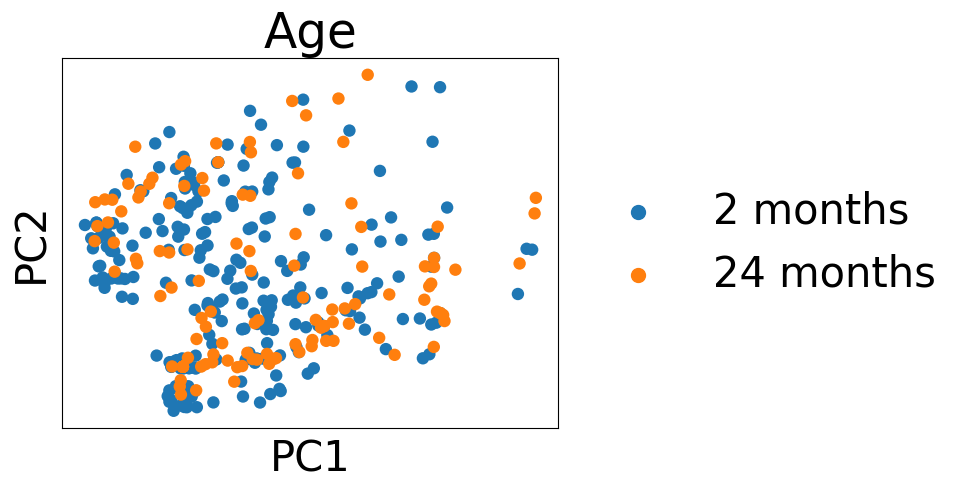

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
find

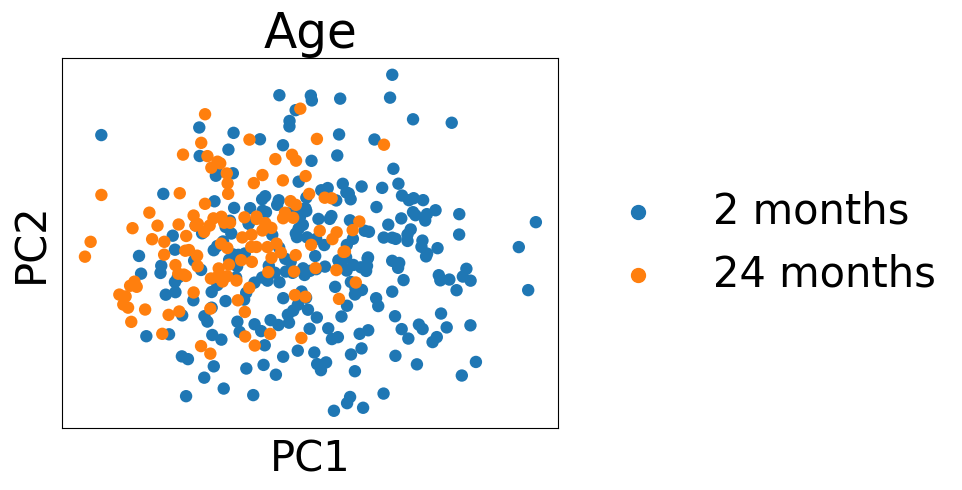

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
find

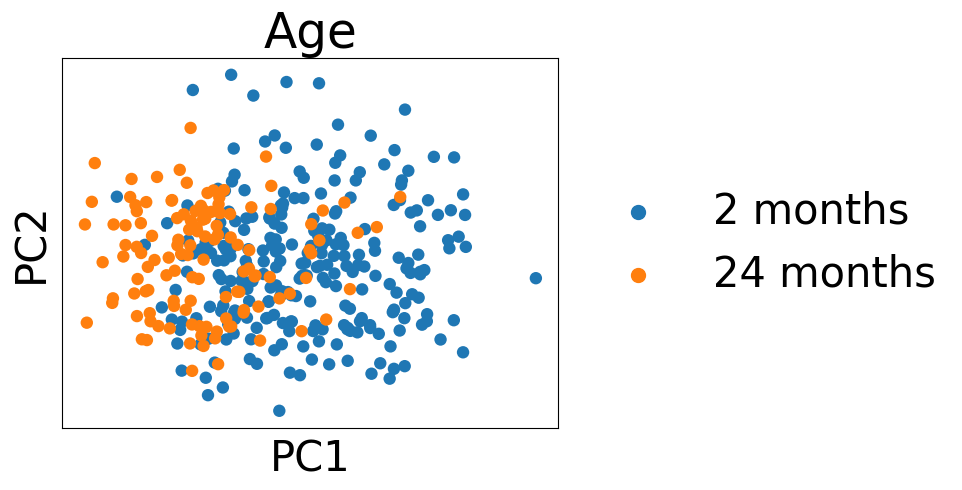

In [15]:
sc.pl.pca(ad_coreg, color=['Age'])

sc.pl.pca(ad_stoch, color=['Age'])

sc.pl.pca(ad_random, color=['Age'])

In [16]:
ad_coreg_v2 = ad_coreg[~ad_coreg.obs['Age'].values.isna()]
ad_stoch_v2 = ad_stoch[~ad_stoch.obs['Age'].values.isna()]
ad_random_v2 = ad_random[~ad_random.obs['Age'].values.isna()]

In [17]:
sc.tl.pca(ad_coreg_v2)
sc.tl.pca(ad_stoch_v2)
sc.tl.pca(ad_random_v2)

In [18]:
def plot_pval(p):
    if p < 1e-4:
        return '<0.0001'
    elif p < 1e-3:
        return '<0.001'
    elif p < 1e-2:
        return '<0.01'
    else:
        return f'={p:.2f}'

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family

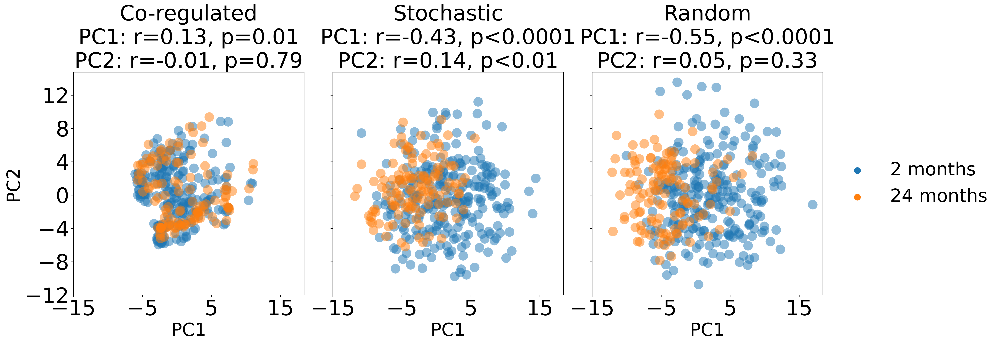

In [19]:
fig, ax = plt.subplots(1,3,dpi=300, sharex=True, sharey=True, figsize=(23,8))
sc.pl.pca(ad_coreg_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,
          show=False,ax=ax[0],legend_loc=None,
          title=f'Co-regulated\nPC1: r={corrs_coreg[0][0]:.2f}, p{plot_pval(corrs_coreg[0][1])}\nPC2: r={corrs_coreg[1][0]:.2f}, p={corrs_coreg[1][1]:.2f}')
sc.pl.pca(ad_stoch_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,
          show=False,ax=ax[1],legend_loc=None,
                    title=f'Stochastic\nPC1: r={corrs_stoch[0][0]:.2f}, p{plot_pval(corrs_stoch[0][1])}\nPC2: r={corrs_stoch[1][0]:.2f}, p{plot_pval(corrs_stoch[1][1])}')

sc.pl.pca(ad_random_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,
          show=False,ax=ax[2],
                    title=f'Random\nPC1: r={corrs_random[0][0]:.2f}, p{plot_pval(corrs_random[0][1])}\nPC2: r={corrs_random[1][0]:.2f}, p{plot_pval(corrs_random[1][1])}')
[ax[i].set_xticks(np.arange(-15, 16, 10)) for i in range(3)]
[ax[i].set_yticks(np.arange(-12, 13, 4)) for i in range(3)]
ax[1].set_ylabel(None)
ax[2].set_ylabel(None)
plt.tight_layout(w_pad=1.05)
plt.savefig('PICS/png/age_corr_scRNAseq.png', dpi=300)
plt.show()

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family

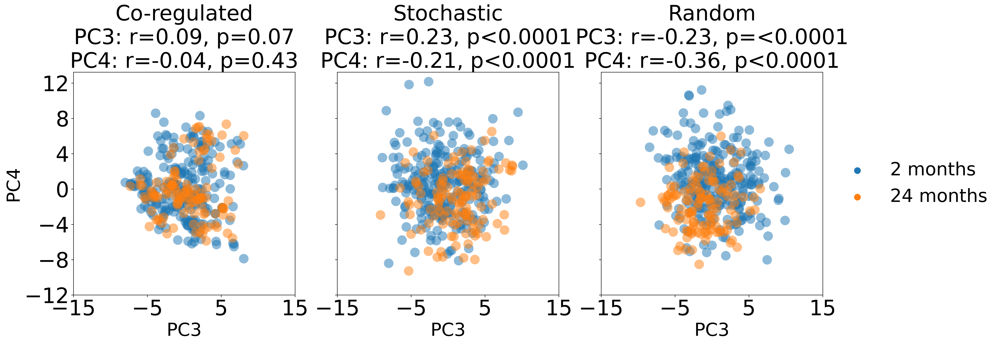

In [20]:
fig, ax = plt.subplots(1,3,dpi=300, sharex=True, sharey=True, figsize=(23,8))
i1 = 2
i2 = 3
sc.pl.pca(ad_coreg_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,components=[3,4],
          show=False,ax=ax[0],legend_loc=None,
          title=f'Co-regulated\nPC{i1+1}: r={corrs_coreg[i1][0]:.2f}, p={corrs_coreg[i1][1]:.2f}\nPC{i2+1}: r={corrs_coreg[i2][0]:.2f}, p{plot_pval(corrs_coreg[i2][1])}')
sc.pl.pca(ad_stoch_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,components=[3,4],
          show=False,ax=ax[1],legend_loc=None,
                    title=f'Stochastic\nPC{i1+1}: r={corrs_stoch[i1][0]:.2f}, p{plot_pval(corrs_stoch[i1][1])}\nPC{i2+1}: r={corrs_stoch[i2][0]:.2f}, p{plot_pval(corrs_stoch[i2][1])}')

sc.pl.pca(ad_random_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,components=[3,4],
          show=False,ax=ax[2],
                    title=f'Random\nPC{i1+1}: r={corrs_random[i1][0]:.2f}, p={plot_pval(corrs_random[i1][1])}\nPC{i2+1}: r={corrs_random[i2][0]:.2f}, p{plot_pval(corrs_random[i2][1])}')
[ax[i].set_xticks(np.arange(-15, 16, 10)) for i in range(3)]
[ax[i].set_yticks(np.arange(-12, 13, 4)) for i in range(3)]
ax[1].set_ylabel(None)
ax[2].set_ylabel(None)
plt.tight_layout(w_pad=1.05)
plt.savefig('PICS/png/age_corr_scRNAseq_PC34.png', dpi=300)
plt.show()

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family

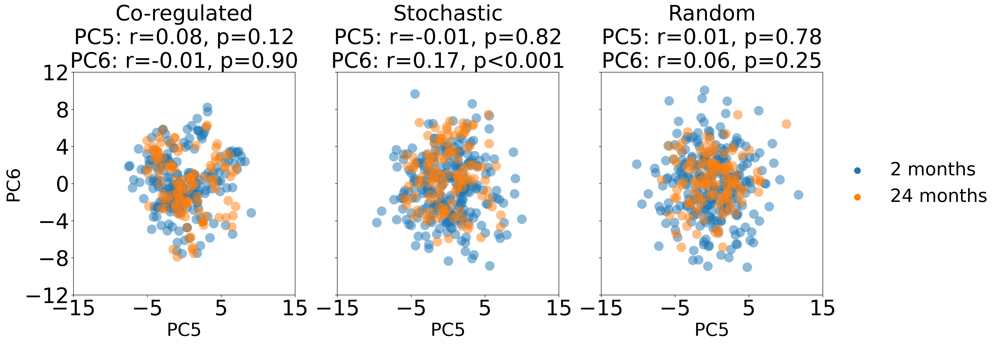

In [21]:
fig, ax = plt.subplots(1,3,dpi=300, sharex=True, sharey=True, figsize=(23,8))
i1 = 4
i2 = 5
sc.pl.pca(ad_coreg_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,components=[5,6],
          show=False,ax=ax[0],legend_loc=None,
          title=f'Co-regulated\nPC{i1+1}: r={corrs_coreg[i1][0]:.2f}, p={corrs_coreg[i1][1]:.2f}\nPC{i2+1}: r={corrs_coreg[i2][0]:.2f}, p={corrs_coreg[i2][1]:.2f}')
sc.pl.pca(ad_stoch_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,components=[5,6],
          show=False,ax=ax[1],legend_loc=None,
                    title=f'Stochastic\nPC{i1+1}: r={corrs_stoch[i1][0]:.2f}, p={corrs_stoch[i1][1]:.2f}\nPC{i2+1}: r={corrs_stoch[i2][0]:.2f}, p<0.001')

sc.pl.pca(ad_random_v2, color=['Age'], cmap='RdYlGn',alpha=0.5,s=1000,components=[5,6],
          show=False,ax=ax[2],
                    title=f'Random\nPC{i1+1}: r={corrs_random[i1][0]:.2f}, p={corrs_random[i1][1]:.2f}\nPC{i2+1}: r={corrs_random[i2][0]:.2f}, p={corrs_random[i2][1]:.2f}')
[ax[i].set_xticks(np.arange(-15, 16, 10)) for i in range(3)]
[ax[i].set_yticks(np.arange(-12, 13, 4)) for i in range(3)]
ax[1].set_ylabel(None)
ax[2].set_ylabel(None)
plt.tight_layout(w_pad=1.05)
plt.savefig('PICS/png/age_corr_scRNAseq_PC56.png', dpi=300)
plt.show()

In [22]:
idx_coreg = np.argsort(np.abs(ad_coreg_v2.varm['PCs'][:,0]))[::-1]
idx_stoch = np.argsort(np.abs(ad_stoch_v2.varm['PCs'][:,0]))[::-1]
idx_random = np.argsort(np.abs(ad_random_v2.varm['PCs'][:,0]))[::-1]#.shape

In [23]:
# len(idx_coreg)

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

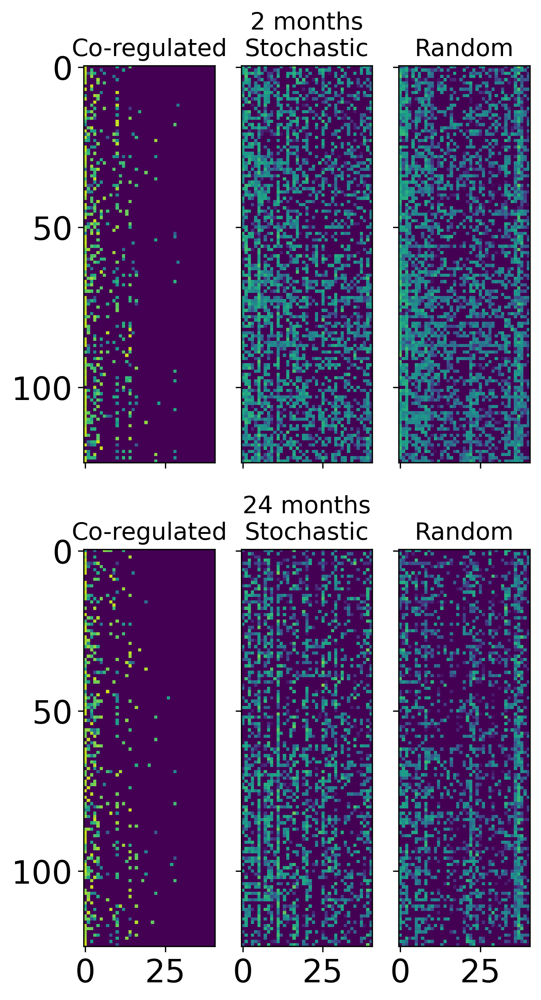

In [24]:
idx_old = ad_coreg_v2.obs['Age'].values == '24 months'

vmin = 0
vmax = 10
fig, ax = plt.subplots(2,3,dpi=300, sharex=True, sharey=True, figsize=(5,10))
N2plot = ad_coreg_v2.shape[1]
im = ax[0,0].imshow(ad_coreg_v2.X[~idx_old,:][:,idx_coreg][:,:N2plot], vmin=vmin, vmax=vmax)
ax[0,1].imshow(ad_stoch_v2.X[~idx_old,:][:,idx_stoch][:,:N2plot], vmin=vmin, vmax=vmax)
ax[0,2].imshow(ad_random_v2.X[~idx_old,:][:,idx_random][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,0].imshow(ad_coreg_v2.X[idx_old,:][:,idx_coreg][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,1].imshow(ad_stoch_v2.X[idx_old,:][:,idx_stoch][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,2].imshow(ad_random_v2.X[idx_old,:][:,idx_random][:,:N2plot], vmin=vmin, vmax=vmax)
ax[0,0].set_title('Co-regulated', fontsize=15)
ax[0,1].set_title('2 months\nStochastic', fontsize=15)
ax[0,2].set_title('Random', fontsize=15)
ax[1,0].set_title('Co-regulated', fontsize=15)
ax[1,1].set_title('24 months\nStochastic', fontsize=15)
ax[1,2].set_title('Random', fontsize=15)
plt.xticks(None)
plt.yticks(None)
for label in ax[0,0].get_yticklabels():
    label.set_fontsize(20)
for label in ax[1,0].get_yticklabels():
    label.set_fontsize(20)
for label in ax[1,0].get_xticklabels():
    label.set_fontsize(20)
for label in ax[1,1].get_xticklabels():
    label.set_fontsize(20)
for label in ax[1,2].get_xticklabels():
    label.set_fontsize(20)
# fig.text(0.5, 0.01, 'Genes', ha='center', va='center', fontsize=35)
# fig.text(-0.02, 0.5, 'Cells', ha='center', va='center', rotation=90, fontsize=35)
# plt.tight_layout(pad=1.2, h_pad=1.2, w_pad=1.2)
plt.savefig('PICS/png/heatmaps_corr_scRNAseq.png', dpi=300)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

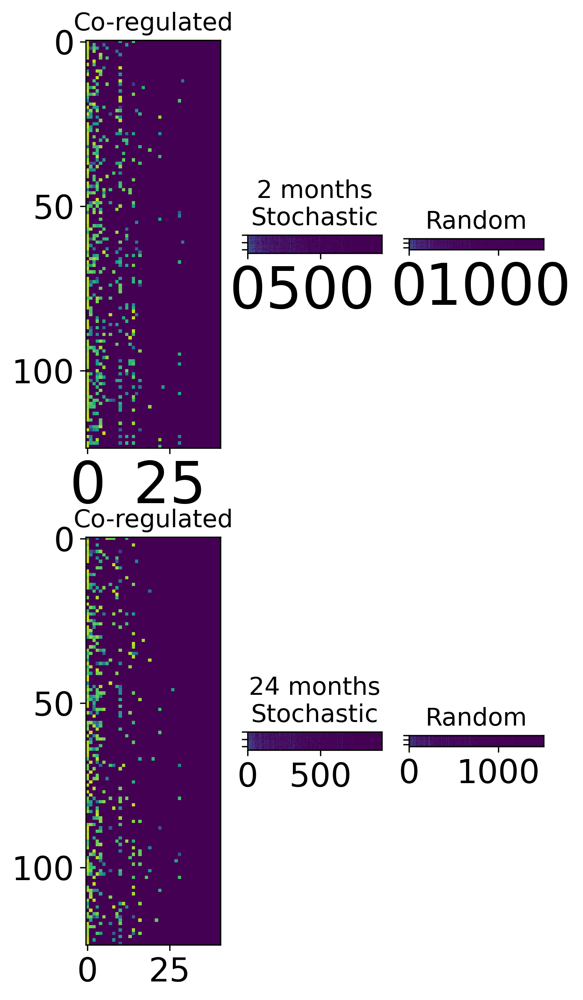

In [25]:
idx_old = ad_coreg_v2.obs['Age'].values == '24 months'

vmin = 0
vmax = 10
fig, ax = plt.subplots(2,3,dpi=300, sharex=False, sharey=True, figsize=(5,10))
N2plot = ad_coreg_v2.shape[1]
im = ax[0,0].imshow(ad_coreg_v2.X[~idx_old,:][:,idx_coreg][:,:N2plot], vmin=vmin, vmax=vmax)
ax[0,1].imshow(ad_stoch_v2.X[~idx_old,:][:,idx_stoch], vmin=vmin, vmax=vmax)
ax[0,2].imshow(ad_random_v2.X[~idx_old,:][:,idx_random], vmin=vmin, vmax=vmax)
ax[1,0].imshow(ad_coreg_v2.X[idx_old,:][:,idx_coreg][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,1].imshow(ad_stoch_v2.X[idx_old,:][:,idx_stoch], vmin=vmin, vmax=vmax)
ax[1,2].imshow(ad_random_v2.X[idx_old,:][:,idx_random], vmin=vmin, vmax=vmax)
ax[0,0].set_title('Co-regulated', fontsize=15)
ax[0,1].set_title('2 months\nStochastic', fontsize=15)
ax[0,2].set_title('Random', fontsize=15)
ax[1,0].set_title('Co-regulated', fontsize=15)
ax[1,1].set_title('24 months\nStochastic', fontsize=15)
ax[1,2].set_title('Random', fontsize=15)
plt.xticks(None)
plt.yticks(None)
for label in ax[0,0].get_yticklabels():
    label.set_fontsize(20)
for label in ax[1,0].get_yticklabels():
    label.set_fontsize(20)
for label in ax[1,0].get_xticklabels():
    label.set_fontsize(20)
for label in ax[1,1].get_xticklabels():
    label.set_fontsize(20)
for label in ax[1,2].get_xticklabels():
    label.set_fontsize(20)
# fig.text(0.5, 0.01, 'Genes', ha='center', va='center', fontsize=35)
# fig.text(-0.02, 0.5, 'Cells', ha='center', va='center', rotation=90, fontsize=35)
# plt.tight_layout(pad=1.2, h_pad=1.2, w_pad=1.2)
plt.savefig('PICS/png/heatmaps_full_corr_scRNAseq.png', dpi=300)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

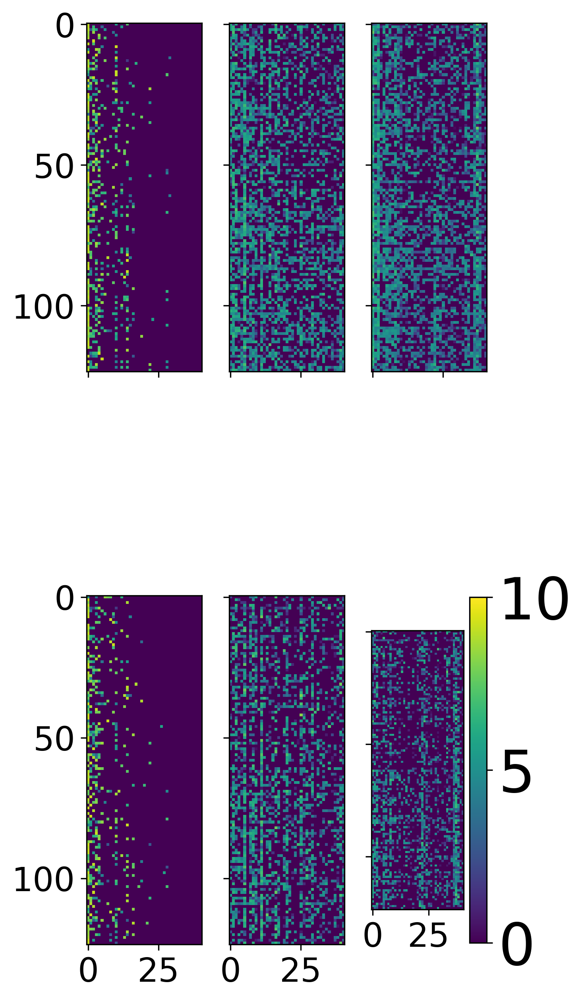

In [26]:
idx_old = ad_coreg_v2.obs['Age'].values == '24 months'

vmin = 0
vmax = 10
fig, ax = plt.subplots(2,3,dpi=300, sharex=True, sharey=True, figsize=(5,10))
N2plot = ad_coreg_v2.shape[1]
im = ax[0,0].imshow(ad_coreg_v2.X[~idx_old,:][:,idx_coreg][:,:N2plot], vmin=vmin, vmax=vmax)
ax[0,1].imshow(ad_stoch_v2.X[~idx_old,:][:,idx_stoch][:,:N2plot], vmin=vmin, vmax=vmax)
ax[0,2].imshow(ad_random_v2.X[~idx_old,:][:,idx_random][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,0].imshow(ad_coreg_v2.X[idx_old,:][:,idx_coreg][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,1].imshow(ad_stoch_v2.X[idx_old,:][:,idx_stoch][:,:N2plot], vmin=vmin, vmax=vmax)
ax[1,2].imshow(ad_random_v2.X[idx_old,:][:,idx_random][:,:N2plot], vmin=vmin, vmax=vmax)
# ax[0,0].set_title('Co-regulated', fontsize=15)
# ax[0,1].set_title('2 months\nStochastic', fontsize=15)
# ax[0,2].set_title('Random', fontsize=15)
# ax[1,0].set_title('Co-regulated', fontsize=15)
# ax[1,1].set_title('24 months\nStochastic', fontsize=15)
# ax[1,2].set_title('Random', fontsize=15)
plt.xticks(None)
plt.yticks(None)
for label in ax[0,0].get_yticklabels():
    label.set_fontsize(20)
for label in ax[1,0].get_yticklabels():
    label.set_fontsize(20)
for label in ax[1,0].get_xticklabels():
    label.set_fontsize(20)
for label in ax[1,1].get_xticklabels():
    label.set_fontsize(20)
for label in ax[1,2].get_xticklabels():
    label.set_fontsize(20)
# fig.text(0.5, 0.01, 'Genes', ha='center', va='center', fontsize=35)
# fig.text(-0.02, 0.5, 'Cells', ha='center', va='center', rotation=90, fontsize=35)
# plt.tight_layout(pad=1.2, h_pad=1.2, w_pad=1.2)
fig.colorbar(im, ax=ax[1,2])
plt.tight_layout()
plt.savefig('PICS/png/heatmaps_corr_scRNAseq_colorbar.png', dpi=300)
plt.show()

# side by side scDNAm vs scRNAseq

In [27]:
# df_cpgs = pd.read_csv('orrs/Aggregated_by_genes_CpG2gene_table_v3.csv', index_col=0)
# # df_genes = pd.read_csv('orrs/Aggregated_by_genes_CpG2gene_table_plus_strand_proper_genes_at_least_3_CpGs_v3.csv')
# df_cpgs.head()

In [28]:
df_cpgs = pd.read_csv('orrs/Full_CpG2gene_table_minus_strand_proper_genes_v3.csv', index_col=0)
# df_cpgs = pd.read_csv('orrs/Full_CpG2gene_table_v3.csv', index_col=0)
# df_genes = pd.read_csv('orrs/Aggregated_by_genes_CpG2gene_table_plus_strand_proper_genes_at_least_3_CpGs_v3.csv')
df_cpgs.head()

,Unnamed: 0,Unnamed: 0.1,hypermethylated_with_age,hypomethylated_with_age,random_subset,coreg_0.1,stoch_0.1,coreg_0.2,stoch_0.2,coreg_0.3,...,stoch_0.8,coreg_0.9,stoch_0.9,pos,symbol,symbol_plus,symbol_minus,phyloP,phastCons,geneName
index,,,,,,,,,,,,,,,,,,,,,
chr10_100479091,0,14,False,True,True,True,False,True,False,True,...,True,False,True,1.010048e+10,Tmtc3,NaN,Tmtc3,NaN,NaN,Tmtc3
chr10_100587817,1,16,False,True,False,False,True,False,True,False,...,True,False,True,1.010059e+10,4930430F08Rik,1700017N19Rik,4930430F08Rik,0.268,0.066,4930430F08Rik
chr10_103121716,2,47,True,False,True,True,False,True,False,True,...,True,False,True,1.010312e+10,Lrriq1,NaN,Lrriq1,-0.832,0.035,Lrriq1
chr10_103123829,3,48,False,True,False,True,False,True,False,True,...,True,False,True,1.010312e+10,Lrriq1,NaN,Lrriq1,NaN,NaN,Lrriq1
chr10_103140771,4,49,True,False,False,True,False,True,False,True,...,True,False,True,1.010314e+10,Lrriq1,NaN,Lrriq1,-0.501,0.000,Lrriq1


In [29]:
df = df_genes[['0.4_Fraction_of_Random', '0.4_Fraction_of_CoReg', '0.4_Fraction_of_Stoch']]
genes_coreg = df[df['0.4_Fraction_of_CoReg'] > 0.5].index.values.astype(str)
genes_stoch = df[df['0.4_Fraction_of_Stoch'] > 0.5].index.values.astype(str)
genes_random = df[df['0.4_Fraction_of_Random'] > 0.5].index.values.astype(str)
print(genes_coreg.shape, genes_stoch.shape, genes_random.shape)

(41,) (923,) (1505,)


In [30]:
genes_coreg

array(['Trhde', 'Slc35e3', 'Sec14l2', 'Pold2', 'Acadvl', 'Nfkbia',
       'Acyp1', '3110070M22Rik', 'Gm5087', 'Xpo7', 'Lynx1', 'Mospd4',
       '4930546C10Rik', 'Ppp1r32', 'Gcnt1', '1110059E24Rik', 'Lhx4',
       'Grem2', 'Duox2', 'Gatm', 'Sall4', 'Uckl1', 'Gm13601', 'Agl',
       'B4galt2', 'Tinagl1', 'Ldlrad2', 'Efhd2', 'Ubl3', 'Gtf3c2',
       'Gm15492', 'Gm15475', 'Dcun1d3', 'Nfkbib', 'Fan1', 'Chd2', 'Dhx38',
       'Lzts1', 'Calr3', 'Gabra3', 'Mageb18'], dtype='<U13')

In [31]:
df_coreg_cpgs = df_cpgs[df_cpgs['geneName'].isin(genes_coreg)]
df_stoch_cpgs = df_cpgs[df_cpgs['geneName'].isin(genes_stoch)]
df_random_cpgs = df_cpgs[df_cpgs['geneName'].isin(genes_random)]

In [32]:
df_coreg_cpgs

,Unnamed: 0,Unnamed: 0.1,hypermethylated_with_age,hypomethylated_with_age,random_subset,coreg_0.1,stoch_0.1,coreg_0.2,stoch_0.2,coreg_0.3,...,stoch_0.8,coreg_0.9,stoch_0.9,pos,symbol,symbol_plus,symbol_minus,phyloP,phastCons,geneName
index,,,,,,,,,,,,,,,,,,,,,
chr10_114423669,49,292,True,False,False,True,False,True,False,True,...,True,False,True,1.011442e+10,Trhde,NaN,Trhde,NaN,NaN,Trhde
chr10_114532015,50,294,True,False,False,True,False,True,False,True,...,True,False,True,1.011453e+10,Trhde,NaN,Trhde,NaN,NaN,Trhde
chr10_114532044,51,295,True,False,False,True,False,True,False,True,...,True,False,True,1.011453e+10,Trhde,NaN,Trhde,NaN,NaN,Trhde
chr10_114705086,52,298,True,False,True,True,False,True,False,True,...,True,False,True,1.011471e+10,Trhde,NaN,Trhde,NaN,NaN,Trhde
chr10_114800328,53,300,True,False,False,False,True,False,True,False,...,True,False,True,1.011480e+10,Trhde,Gm15723,Trhde,0.759,0.002,Trhde
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
chrX_92240056,29354,103672,True,False,False,True,True,True,True,True,...,True,True,True,2.009224e+10,Mageb18,NaN,Mageb18,NaN,NaN,Mageb18
chrX_92242736,29355,103673,False,True,True,True,True,True,True,True,...,True,True,True,2.009224e+10,Mageb18,NaN,Mageb18,NaN,NaN,Mageb18
chrX_92242776,29356,103674,False,True,True,True,True,True,True,True,...,True,True,True,2.009224e+10,Mageb18,NaN,Mageb18,NaN,NaN,Mageb18


In [33]:
# df_coreg_cpgs.geneName.tolist()

In [38]:
# dump_key = '_v2'
# ad_dnam = sct.io.read_adata(f'gs://retro-personal-andrei/scDNAm/scDNAm/data/GSE121436/GSE121436_coverage_0_binned_by_1_wmeta_mm10{dump_key}.h5ad', overwrite=True)

dump_key = ''
ad_dnam = sct.io.read_adata(f'gs://retro-personal-andrei/scDNAm/scDNAm/data/GSE121436/GSE121436_wmeta{dump_key}.h5ad', overwrite=True)

2024-01-24 07:12:38.604 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/data/GSE121436/GSE121436_wmeta.h5ad', checksum='fbE1p6odG56X1CZsYK0QSA==')


In [42]:
ad_dnam = ad_dnam.T

In [43]:
com_idx = np.intersect1d(df_coreg_cpgs.index, ad_dnam.var.index)
print(com_idx.shape)

(158,)


In [44]:
ad_dnam_coreg = ad_dnam[:, df_coreg_cpgs.index].copy()
ad_dnam_stoch = ad_dnam[:, df_stoch_cpgs.index].copy()
ad_dnam_random = ad_dnam[:, df_random_cpgs.index].copy()

In [45]:
ad_dnam_coreg

AnnData object with n_obs × n_vars = 550 × 158
    obs: 'Run', 'Age', 'Assay Type', 'AvgSpotLen', 'Bases', 'BioProject', 'BioSample', 'Bytes', 'Cell_type', 'Center Name', 'Consent', 'DATASTORE filetype', 'DATASTORE provider', 'DATASTORE region', 'Experiment', 'GEO_Accession (exp)', 'Instrument', 'LibraryLayout', 'LibrarySelection', 'LibrarySource', 'Mouse_ID', 'Organism', 'Platform', 'ReleaseDate', 'Sample Name', 'source_name', 'SRA Study', 'strain', 'Age_months', 'Data Type'

In [46]:
ad_coreg_rna = ad_coreg_v2[:,df_coreg_cpgs['geneName'].values[:158]].copy()
ad_stoch_rna = ad_stoch_v2[:,df_stoch_cpgs['geneName'].values[:158]].copy()
ad_random_rna = ad_random_v2[:,df_random_cpgs['geneName'].values[:158]].copy()

/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/home/jupyter/miniconda3/envs/scDNAm/lib/python3.10/site-packages/anndata/_core/anndata.py:1840: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [47]:
genes = df_coreg_cpgs['geneName'].values

state_data = genes

# Create a unique mapping from gene names to integers
unique_genes = np.unique(state_data)
gene_to_int = {gene: i for i, gene in enumerate(unique_genes)}

# Convert state data to numerical values
state_data_numerical = np.array([gene_to_int[gene] for gene in state_data])

# Create a colormap (you can choose or define your own)
cmap = plt.cm.get_cmap('twilight', len(unique_genes))


['Y8', 'O8', 'Y7', 'Y2', 'O1', 'O5']
Categories (6, object): ['O1', 'O5', 'O8', 'Y2', 'Y7', 'Y8']
['Y2', 'Y7', 'Y8', 'O5', 'O1', 'O8']


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

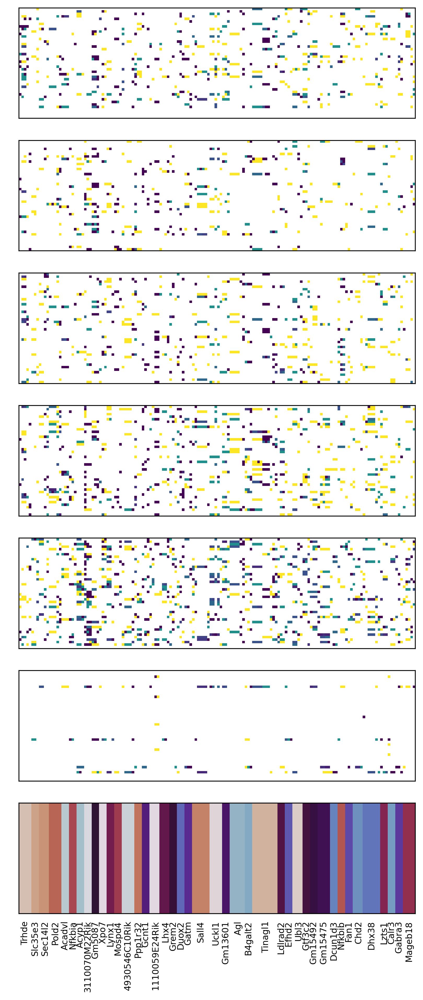

In [48]:
params = ad_dnam_coreg.obs.iloc[::2]
mice = params['Mouse_ID'].unique()
print(mice)
mice = ['Y2', 'Y7', 'Y8', 'O5', 'O1', 'O8']
mice_young = ['Y2', 'Y7', 'Y8', 'O5']
print(mice)
fig, ax = plt.subplots(len(mice)+1,1,figsize=(7,15),
                       # figsize=figsize_for[direction],
                       dpi=300, #sharex=True,
                       sharey=True)
x_cor = ad_dnam_coreg.X.todense().A[::2]
x_cor_cov = ad_dnam_coreg.X.todense().A[1::2]
x_cor[x_cor_cov < 0.5] = np.nan
xpos = x_cor
xplot = 44
for i,mouse in enumerate(mice):
    jdx = params['Mouse_ID'].values == mouse
    xmouse = xpos[jdx,:]
    ax[i].imshow(xmouse[:xplot,:])
    

ax[len(mice)].imshow([state_data_numerical] * xplot, cmap=cmap)#, extent=extent)

[ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
ax[len(mice)].tick_params(labelcolor='k', top=False, bottom=False, left=False, right=False)
ax[len(mice)].set_yticklabels([])

un_genes, idx_un = np.unique(df_coreg_cpgs['geneName'].values, return_index=True)
isort = np.argsort(idx_un)
un_genes = un_genes[isort]
idx_un = []
for gene in un_genes:
    idx_un.append(np.nonzero(genes == gene)[0][0])
idx_un = np.array(idx_un)
idx_un_2 = np.hstack((idx_un, xmouse.shape[1]))
pos_un = (0.5 * (idx_un_2[1:] + idx_un_2[:-1])).astype(int)
# pos_un = idx_un
ax[len(mice)].set_xticks(pos_un)  # Set x-tick positions
ax[len(mice)].set_xticklabels(un_genes.astype(str), rotation=90, fontsize=8)  # Set x-tick labels and rotate
plt.savefig(f'PICS/png/Coreg_DNAm.png', format='png', dpi=300)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


['Y4', 'Y5', 'Y7', NaN, 'Y8', 'O1', 'O5']
Categories (6, object): ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
['Y4', 'Y5', 'Y7', 'Y8', 'O1', 'O5']
(60, 158)
(44, 158)
(71, 158)
(75, 158)
(56, 158)
(68, 158)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

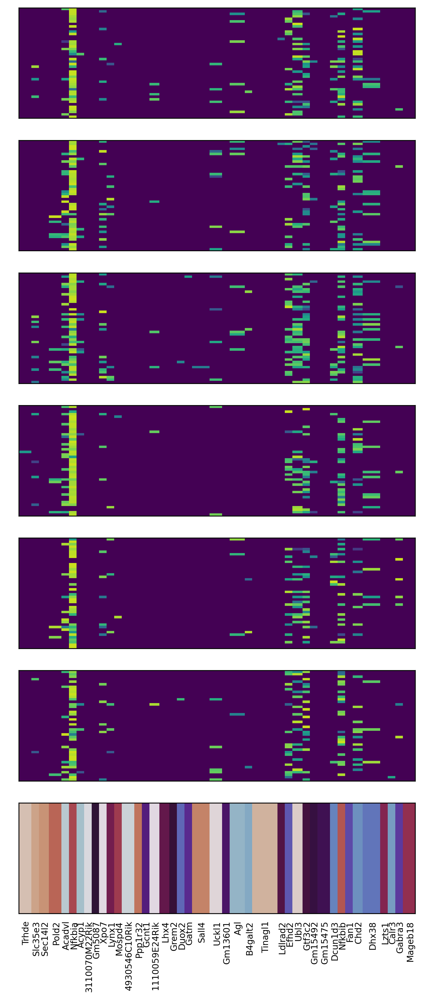

In [49]:
params = ad_coreg_rna.obs#.iloc[::2]
mice = params['Mouse_ID'].unique()
print(mice)
mice = ['Y4', 'Y5', 'Y7', 'Y8', 'O1', 'O5']
mice_young = ['Y4', 'Y5', 'Y7', 'Y8']
print(mice)
fig, ax = plt.subplots(len(mice)+1,1,figsize=(7,15),
                       # figsize=figsize_for[direction],
                       dpi=300, #sharex=True, 
                       sharey=True)
# plt.subplots_adjust(hspace=0.5)
x_cor = ad_coreg_rna.X
xpos = x_cor
xplot = 44
for i,mouse in enumerate(mice):
    # print(xmouse.shape)
    jdx = params['Mouse_ID'].values == mouse
    xmouse = xpos[jdx,:]
    print(xmouse.shape)
    ax[i].imshow(xmouse[:xplot,:], vmin=0, vmax=10)
    
ax[len(mice)].imshow([state_data_numerical] * xplot, cmap=cmap)#, extent=extent)

# [ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
# # ax[len(mice)].ticklabels_params(labelcolor='none', which='both', top=False, bottom=True, left=False, right=False)
# ax[len(mice)].set_xticklabels(ad_coreg_rna.var.index)


[ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
ax[len(mice)].tick_params(labelcolor='k', top=False, bottom=False, left=False, right=False)
ax[len(mice)].set_yticklabels([])

idx_un_2 = np.hstack((idx_un, xmouse.shape[1]))
pos_un = (0.5 * (idx_un_2[1:] + idx_un_2[:-1]))
ax[len(mice)].set_xticks(pos_un)  # Set x-tick positions
ax[len(mice)].set_xticklabels(un_genes.astype(str), rotation=90, fontsize=8)#, ha='right')  # Set x-tick labels and rotate
plt.savefig(f'PICS/png/Coreg_mRNA.png', format='png', dpi=300)
plt.show()

In [50]:
# state_data

In [51]:
genes = df_stoch_cpgs['geneName'].values[:158]

state_data = genes

# Create a unique mapping from gene names to integers
unique_genes = np.unique(state_data)
gene_to_int = {gene: i for i, gene in enumerate(unique_genes)}

# Convert state data to numerical values
state_data_numerical = np.array([gene_to_int[gene] for gene in state_data])

# Create a colormap (you can choose or define your own)
cmap = plt.cm.get_cmap('twilight', len(unique_genes))


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


['Y8', 'O8', 'Y7', 'Y2', 'O1', 'O5']
Categories (6, object): ['O1', 'O5', 'O8', 'Y2', 'Y7', 'Y8']
['Y2', 'Y7', 'Y8', 'O5', 'O1', 'O8']


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

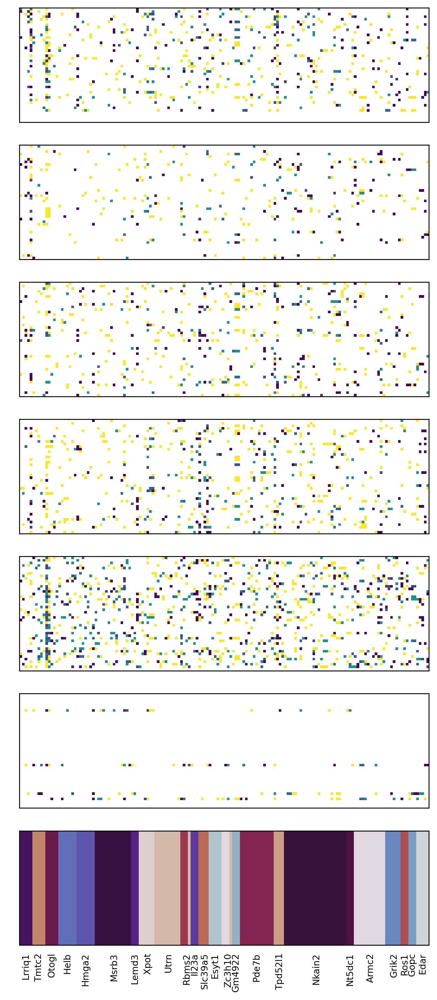

In [52]:
params = ad_dnam_stoch.obs.iloc[::2]
mice = params['Mouse_ID'].unique()
print(mice)
mice = ['Y2', 'Y7', 'Y8', 'O5', 'O1', 'O8']
mice_young = ['Y2', 'Y7', 'Y8', 'O5']
print(mice)
fig, ax = plt.subplots(len(mice)+1,1,figsize=(7,15),
                       # figsize=figsize_for[direction],
                       dpi=300, #sharex=True, 
                       sharey=True)
x_cor = ad_dnam_stoch.X.todense().A[::2]
x_cor_cov = ad_dnam_stoch.X.todense().A[1::2]
x_cor[x_cor_cov < 0.5] = np.nan
xpos = x_cor[:,:158]
xplot = 44
for i,mouse in enumerate(mice):
    jdx = params['Mouse_ID'].values == mouse
    xmouse = xpos[jdx,:]
    ax[i].imshow(xmouse[:xplot,:])
    
ax[len(mice)].imshow([state_data_numerical] * xplot, cmap=cmap)#, extent=extent)

[ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
ax[len(mice)].tick_params(labelcolor='k', top=False, bottom=False, left=False, right=False)
ax[len(mice)].set_yticklabels([])

genes = df_stoch_cpgs['geneName'].values[:158]
un_genes, idx_un = np.unique(genes, return_index=True)
isort = np.argsort(idx_un)
un_genes = un_genes[isort]
idx_un = []
for gene in un_genes:
    idx_un.append(np.nonzero(genes == gene)[0][0])
idx_un = np.array(idx_un)

idx_un_2 = np.hstack((idx_un, xmouse.shape[1]))
pos_un = (0.5 * (idx_un_2[1:] + idx_un_2[:-1])).astype(int)
ax[len(mice)].set_xticks(pos_un)  # Set x-tick positions
ax[len(mice)].set_xticklabels(un_genes.astype(str), rotation=90, fontsize=8)  # Set x-tick labels and rotate
plt.savefig(f'PICS/png/Stoch_DNAm.png', format='png', dpi=300)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


['Y4', 'Y5', 'Y7', NaN, 'Y8', 'O1', 'O5']
Categories (6, object): ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
['Y4', 'Y5', 'Y7', 'Y8', 'O1', 'O5']
(60, 158)
(44, 158)
(71, 158)
(75, 158)
(56, 158)
(68, 158)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

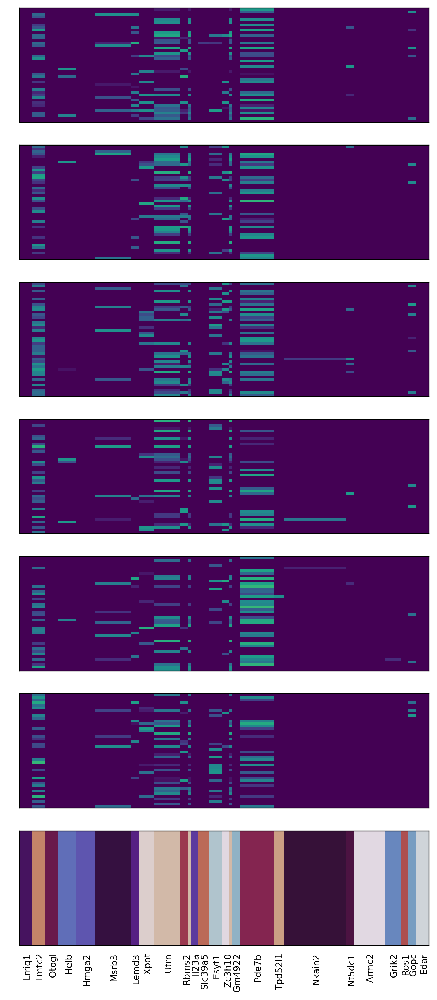

In [53]:
params = ad_stoch_rna.obs#.iloc[::2]
mice = params['Mouse_ID'].unique()
print(mice)
mice = ['Y4', 'Y5', 'Y7', 'Y8', 'O1', 'O5']
mice_young = ['Y4', 'Y5', 'Y7', 'Y8']
print(mice)
fig, ax = plt.subplots(len(mice)+1,1,figsize=(7,15),
                       # figsize=figsize_for[direction],
                       dpi=300, #sharex=True, 
                       sharey=True)
# plt.subplots_adjust(hspace=0.5)
x_cor = ad_stoch_rna.X
xpos = x_cor
xplot = 44
for i,mouse in enumerate(mice):
    # print(xmouse.shape)
    jdx = params['Mouse_ID'].values == mouse
    xmouse = xpos[jdx,:]
    print(xmouse.shape)
    ax[i].imshow(xmouse[:xplot,:], vmin=0, vmax=10)
    
ax[len(mice)].imshow([state_data_numerical] * xplot, cmap=cmap)#, extent=extent)

# [ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
# # ax[len(mice)].ticklabels_params(labelcolor='none', which='both', top=False, bottom=True, left=False, right=False)
# ax[len(mice)].set_xticklabels(ad_coreg_rna.var.index)


[ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
ax[len(mice)].tick_params(labelcolor='k', top=False, bottom=False, left=False, right=False)
ax[len(mice)].set_yticklabels([])

idx_un_2 = np.hstack((idx_un, xmouse.shape[1]))
pos_un = (0.5 * (idx_un_2[1:] + idx_un_2[:-1]))
ax[len(mice)].set_xticks(pos_un)  # Set x-tick positions
ax[len(mice)].set_xticklabels(un_genes.astype(str), rotation=90, fontsize=8)#, ha='right')  # Set x-tick labels and rotate
plt.savefig(f'PICS/png/Stoch_mRNA.png', format='png', dpi=300)
plt.show()

In [54]:
genes = df_random_cpgs['geneName'].values[:158]

state_data = genes

# Create a unique mapping from gene names to integers
unique_genes = np.unique(state_data)
gene_to_int = {gene: i for i, gene in enumerate(unique_genes)}

# Convert state data to numerical values
state_data_numerical = np.array([gene_to_int[gene] for gene in state_data])

# Create a colormap (you can choose or define your own)
cmap = plt.cm.get_cmap('twilight', len(unique_genes))


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


['Y8', 'O8', 'Y7', 'Y2', 'O1', 'O5']
Categories (6, object): ['O1', 'O5', 'O8', 'Y2', 'Y7', 'Y8']
['Y2', 'Y7', 'Y8', 'O5', 'O1', 'O8']


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

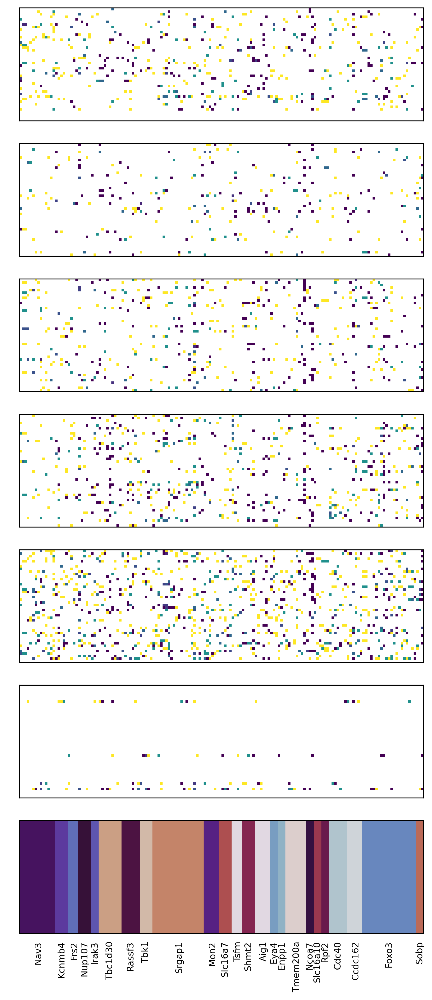

In [55]:
params = ad_dnam_random.obs.iloc[::2]
mice = params['Mouse_ID'].unique()
print(mice)
mice = ['Y2', 'Y7', 'Y8', 'O5', 'O1', 'O8']
mice_young = ['Y2', 'Y7', 'Y8', 'O5']
print(mice)
fig, ax = plt.subplots(len(mice)+1,1,figsize=(7,15),
                       # figsize=figsize_for[direction],
                       dpi=300, #sharex=True,
                       sharey=True)
x_cor = ad_dnam_random.X.todense().A[::2]
x_cor_cov = ad_dnam_random.X.todense().A[1::2]
x_cor[x_cor_cov < 0.5] = np.nan
xpos = x_cor[:,:158]
xplot = 44

for i,mouse in enumerate(mice):
    jdx = params['Mouse_ID'].values == mouse
    xmouse = xpos[jdx,:]
    ax[i].imshow(xmouse[:xplot,:])
    
ax[len(mice)].imshow([state_data_numerical] * xplot, cmap=cmap)#, extent=extent)

[ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
ax[len(mice)].tick_params(labelcolor='k', top=False, bottom=False, left=False, right=False)
ax[len(mice)].set_yticklabels([])

genes = df_random_cpgs['geneName'].values[:158]
un_genes, idx_un = np.unique(genes, return_index=True)
isort = np.argsort(idx_un)
un_genes = un_genes[isort]
idx_un = []
for gene in un_genes:
    idx_un.append(np.nonzero(genes == gene)[0][0])
idx_un = np.array(idx_un)

idx_un_2 = np.hstack((idx_un, xmouse.shape[1]))
pos_un = (0.5 * (idx_un_2[1:] + idx_un_2[:-1])).astype(int)
ax[len(mice)].set_xticks(pos_un)  # Set x-tick positions
ax[len(mice)].set_xticklabels(un_genes.astype(str), rotation=90, fontsize=8)  # Set x-tick labels and rotate
plt.savefig(f'PICS/png/Random_DNAm.png', format='png', dpi=300)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


['Y4', 'Y5', 'Y7', NaN, 'Y8', 'O1', 'O5']
Categories (6, object): ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
['Y4', 'Y5', 'Y7', 'Y8', 'O1', 'O5']
(60, 158)
(44, 158)
(71, 158)
(75, 158)
(56, 158)
(68, 158)


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

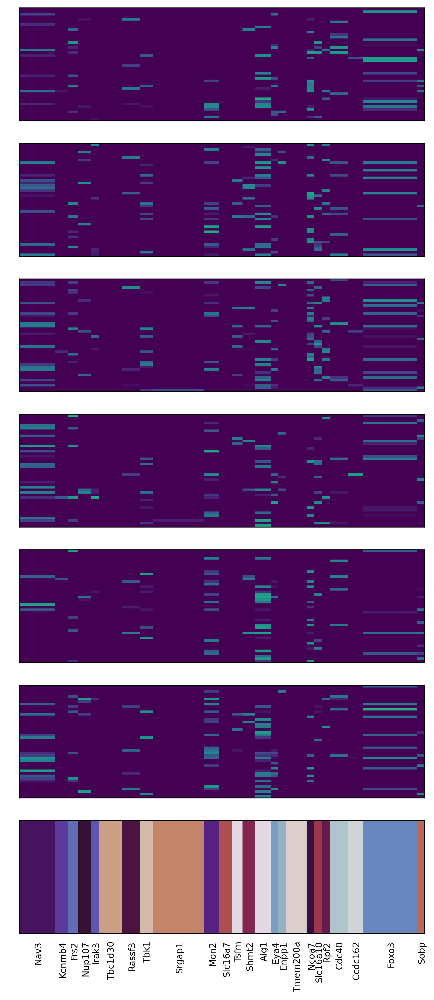

In [56]:
params = ad_random_rna.obs#.iloc[::2]
mice = params['Mouse_ID'].unique()
print(mice)
mice = ['Y4', 'Y5', 'Y7', 'Y8', 'O1', 'O5']
mice_young = ['Y4', 'Y5', 'Y7', 'Y8']
print(mice)
fig, ax = plt.subplots(len(mice)+1,1,figsize=(7,15),
                       # figsize=figsize_for[direction],
                       dpi=300, #sharex=True, 
                       sharey=True)
# plt.subplots_adjust(hspace=0.5)
x_cor = ad_random_rna.X
xpos = x_cor
xplot = 44
for i,mouse in enumerate(mice):
    # print(xmouse.shape)
    jdx = params['Mouse_ID'].values == mouse
    xmouse = xpos[jdx,:]
    print(xmouse.shape)
    ax[i].imshow(xmouse[:xplot,:], vmin=0, vmax=10)
    
ax[len(mice)].imshow([state_data_numerical] * xplot, cmap=cmap)#, extent=extent)

# [ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
# # ax[len(mice)].ticklabels_params(labelcolor='none', which='both', top=False, bottom=True, left=False, right=False)
# ax[len(mice)].set_xticklabels(ad_coreg_rna.var.index)


[ax[i].tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False) for i in range(len(ax))]
ax[len(mice)].tick_params(labelcolor='k', top=False, bottom=False, left=False, right=False)
ax[len(mice)].set_yticklabels([])

idx_un_2 = np.hstack((idx_un, xmouse.shape[1]))
pos_un = (0.5 * (idx_un_2[1:] + idx_un_2[:-1]))
ax[len(mice)].set_xticks(pos_un)  # Set x-tick positions
ax[len(mice)].set_xticklabels(un_genes.astype(str), rotation=90, fontsize=8)#, ha='right')  # Set x-tick labels and rotate
plt.savefig(f'PICS/png/Random_mRNA.png', format='png', dpi=300)
plt.show()

In [57]:
ad_coreg.var['avg_lognorm'] = np.mean(ad_coreg.X, axis=0)
ad_stoch.var['avg_lognorm'] = np.mean(ad_stoch.X, axis=0)
ad_random.var['avg_lognorm'] = np.mean(ad_random.X, axis=0)

In [58]:
sct.pp.lognorm(ad)
ad.var['avg_lognorm'] = np.mean(ad.X, axis=0)

In [59]:
ad_random.var.sort_values(by='avg_lognorm', ascending=False)

,chr,start,0.4_Fraction_of_Random,0.4_Fraction_of_CoReg,0.4_Fraction_of_Stoch,avg_lognorm
geneName,,,,,,
Peg3,7,6703892,0.833333,0.000000,0.166667,5.146796
Lmna,3,88481148,0.666667,0.333333,0.000000,5.135835
Cd82,2,93419111,0.750000,0.000000,0.250000,4.432425
Sparc,11,55394500,1.000000,0.000000,0.000000,4.405641
Dag1,9,108205955,0.750000,0.000000,0.250000,4.203367
...,...,...,...,...,...,...
Tmem130,5,144735915,0.600000,0.200000,0.200000,0.000000
2210019I11Rik,5,147228596,0.666667,0.000000,0.333333,0.000000
Flt1,5,147561604,0.800000,0.000000,0.200000,0.000000


In [60]:
ad_stoch.var.sort_values(by='avg_lognorm', ascending=False).head(5).index

Index(['Rps18', 'Litaf', 'Actn4', 'Runx1', 'Ctsz'], dtype='object', name='geneName')

In [61]:
ad_coreg.var.sort_values(by='avg_lognorm', ascending=False).head(5).index

Index(['Nfkbia', 'Nfkbib', 'Ubl3', 'Gtf3c2', 'Chd2'], dtype='object', name='geneName')

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


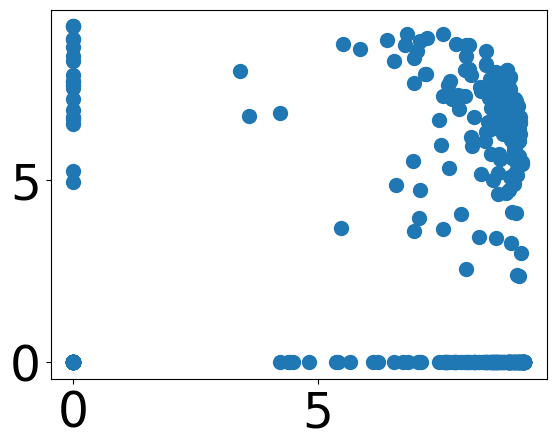

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


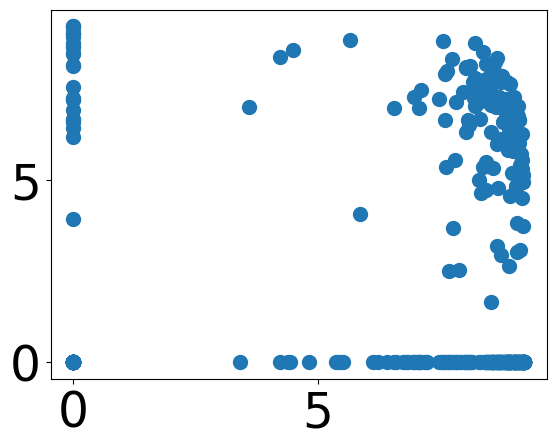

In [62]:
high_genes = ['Nfkbia', 'Nfkbib', 'Ubl3', 'Gtf3c2', 'Chd2']
plt.scatter(ad_coreg[:,high_genes[0]].X, ad_coreg[:,high_genes[1]].X)
plt.show()

plt.scatter(ad_coreg[:,high_genes[0]].X, ad_coreg[:,high_genes[2]].X)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


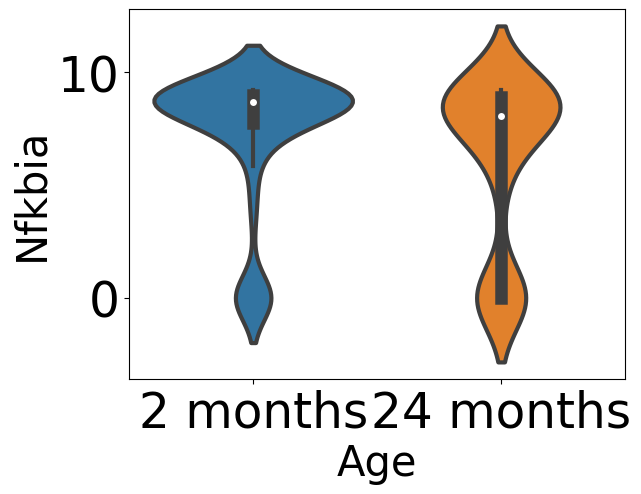

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


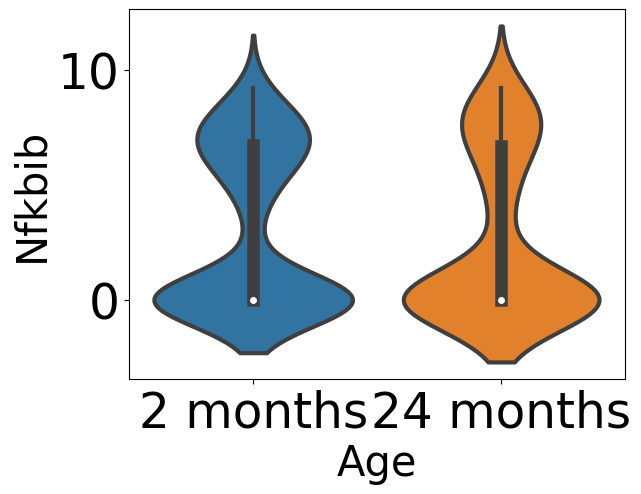

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


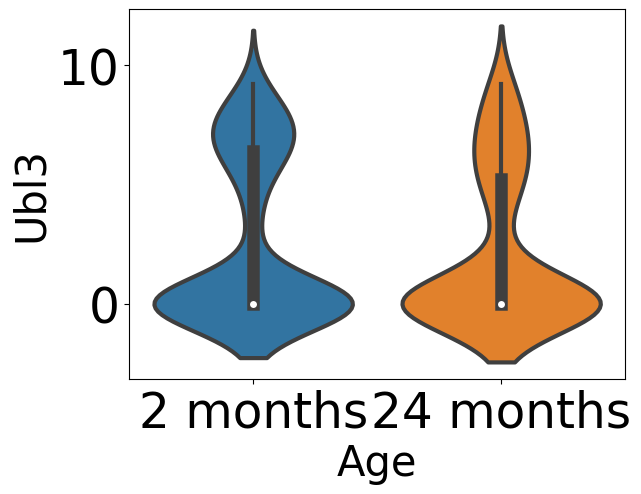

In [63]:
high_genes = ad_coreg.var.sort_values(by='avg_lognorm', ascending=False).index.values
idx_nonan = ~ad_coreg.obs['Age'].isna().values
# ad_coreg[:,high_genes[0]].X[idx_nonan].copy().flatten()
for i in range(3):
    ad_coreg.obs[high_genes[i]] = ad_coreg[:,high_genes[i]].X.copy().flatten()
    sns.violinplot(data=ad_coreg.obs.iloc[idx_nonan],x='Age', y=high_genes[i])
    plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


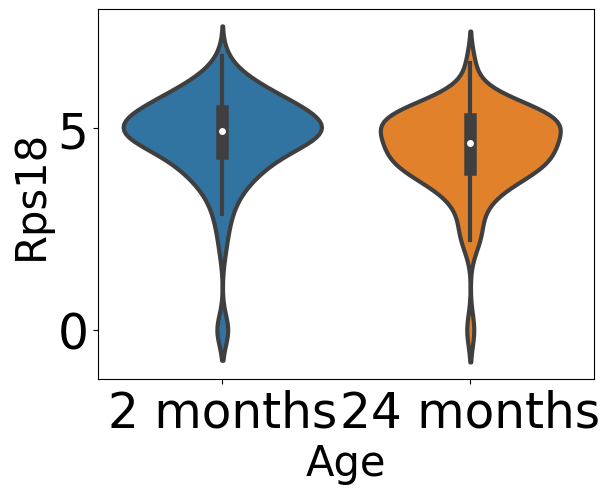

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

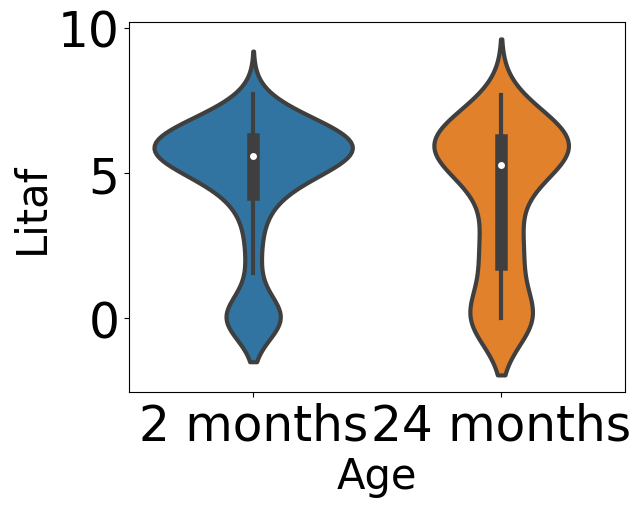

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

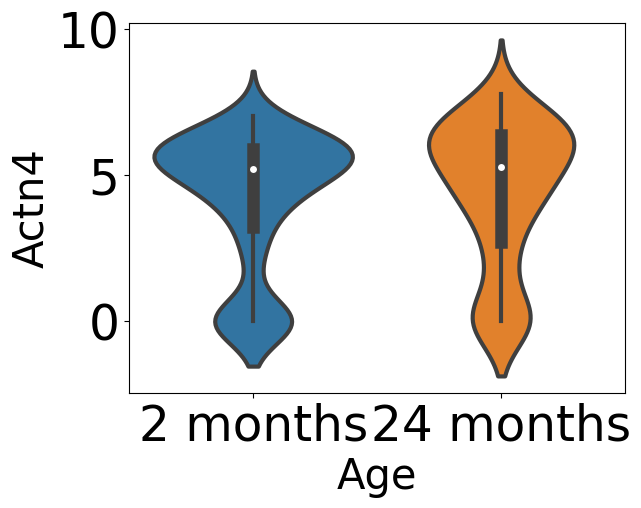

In [64]:
high_genes = ad_stoch.var.sort_values(by='avg_lognorm', ascending=False).index.values
idx_nonan = ~ad_stoch.obs['Age'].isna().values
# ad_coreg[:,high_genes[0]].X[idx_nonan].copy().flatten()
for i in range(3):
    ad_stoch.obs[high_genes[i]] = ad_stoch[:,high_genes[i]].X.copy().flatten()
    sns.violinplot(data=ad_stoch.obs.iloc[idx_nonan],x='Age', y=high_genes[i])
    plt.show()

In [65]:
from scipy.sparse import csr_matrix
df_coreg = pd.DataFrame(data=ad_coreg.X)
df_stoch = pd.DataFrame(data=ad_stoch.X)
df_random = pd.DataFrame(data=ad_random.X)

In [66]:
df_coreg[df_coreg < 1e-3] = np.nan
df_stoch[df_stoch < 1e-3] = np.nan
df_random[df_random < 1e-3] = np.nan

In [67]:
corr_coreg = df_coreg.corr()
corr_stoch = df_stoch.corr()
corr_random = df_random.corr()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

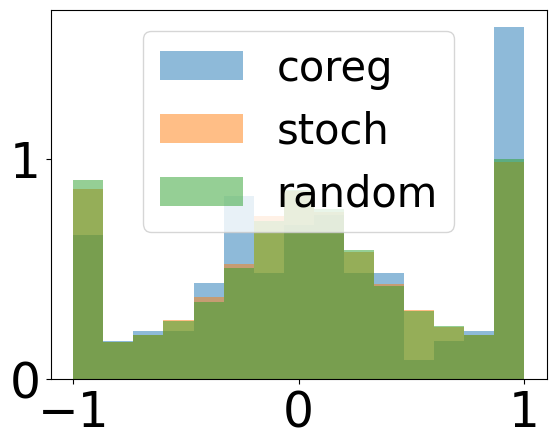

In [68]:
plt.hist(corr_coreg.values.flatten(), alpha=0.5, density=True, label='coreg', bins=15)
plt.hist(corr_stoch.values.flatten(), alpha=0.5, density=True, label='stoch', bins=15)
plt.hist(corr_random.values.flatten(), alpha=0.5, density=True, label='random', bins=15)
plt.legend()
plt.show()

In [69]:
idx_coreg = np.argsort(ad_coreg.var['avg_lognorm'].values)[::-1]
idx_stoch = np.argsort(ad_stoch.var['avg_lognorm'].values)[::-1]
idx_random = np.argsort(ad_random.var['avg_lognorm'].values)[::-1]

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


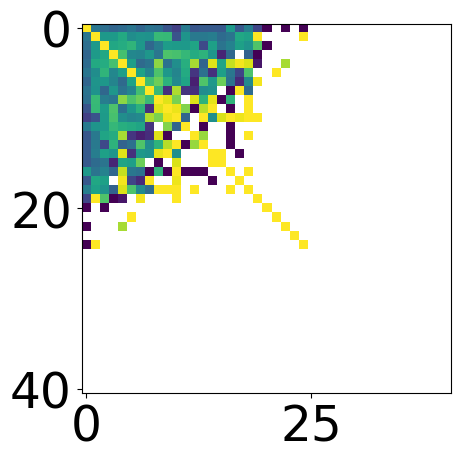

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


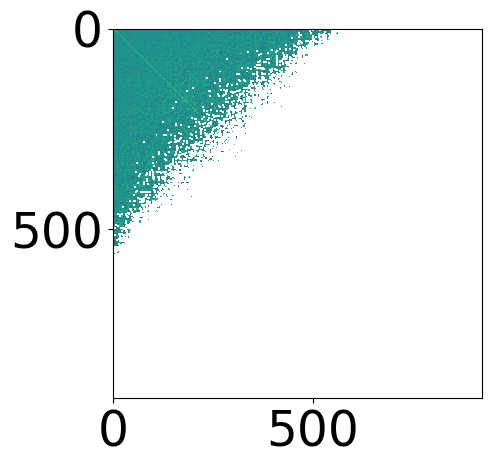

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


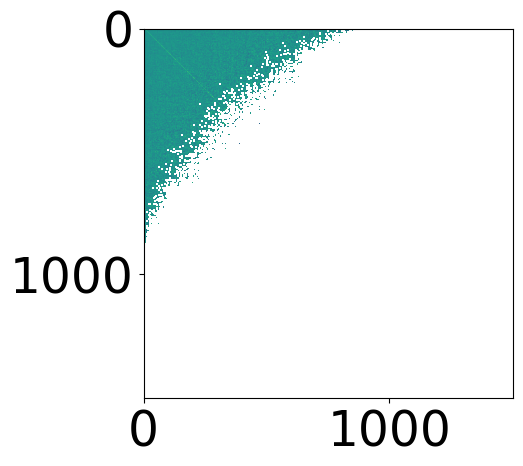

In [70]:
plt.imshow(corr_coreg.values[idx_coreg,:][:, idx_coreg])#, vmin=0.7, vmax=1.0)
plt.show()
plt.imshow(corr_stoch.values[idx_stoch,:][:, idx_stoch])#, vmin=0.7, vmax=1.0)
plt.show()
plt.imshow(corr_random.values[idx_random, :][:,idx_random])#, vmin=0.7, vmax=1.0)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


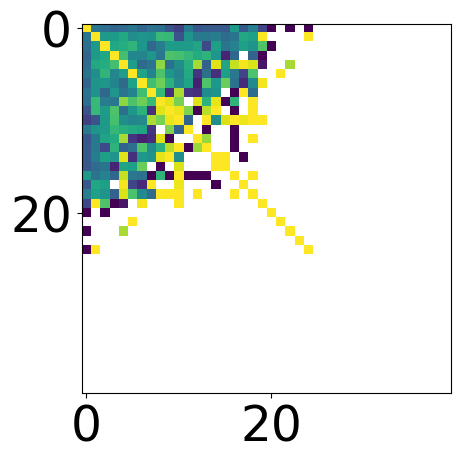

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


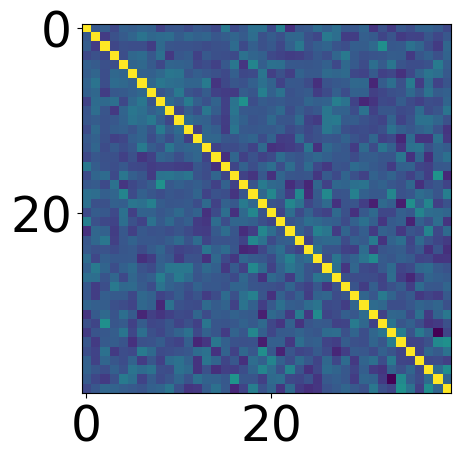

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


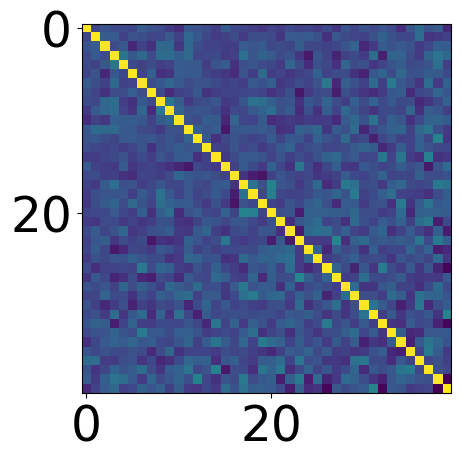

In [71]:
plt.imshow(corr_coreg.values[idx_coreg,:][:, idx_coreg][:40,:40])#, vmin=0.7, vmax=1.0)
plt.show()
plt.imshow(corr_stoch.values[idx_stoch,:][:, idx_stoch][:40,:40])#, vmin=0.7, vmax=1.0)
plt.show()
plt.imshow(corr_random.values[idx_random, :][:,idx_random][:40,:40])#, vmin=0.7, vmax=1.0)
plt.show()

In [72]:
corr_coreg = np.corrcoef(ad_coreg.X.T)
corr_stoch = np.corrcoef(ad_stoch.X.T)
corr_random = np.corrcoef(ad_random.X.T)

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


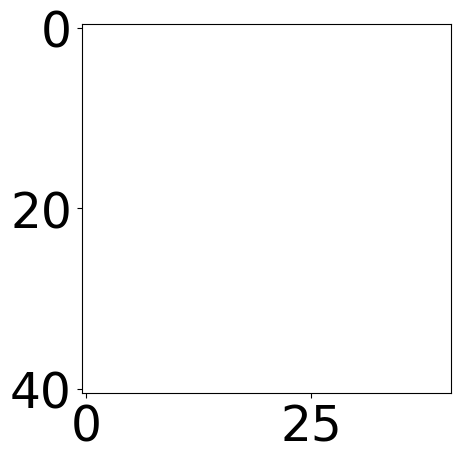

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


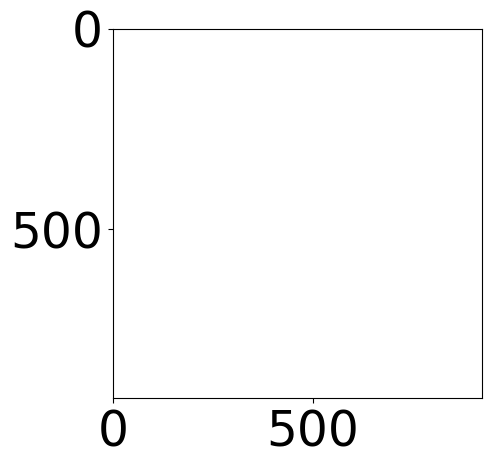

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


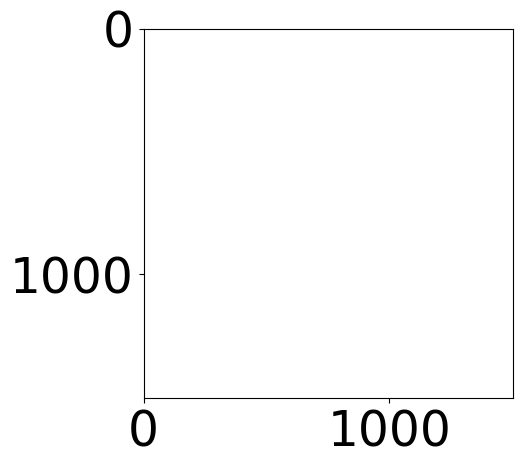

In [73]:
plt.imshow(corr_coreg)
plt.show()
plt.imshow(corr_stoch)
plt.show()
plt.imshow(corr_random)
plt.show()

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

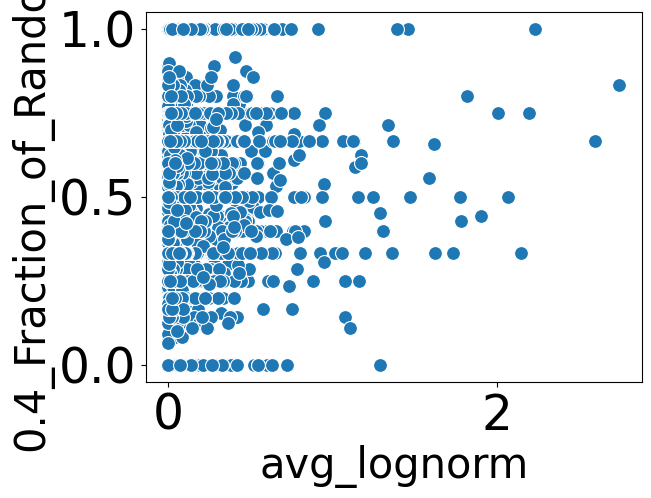

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

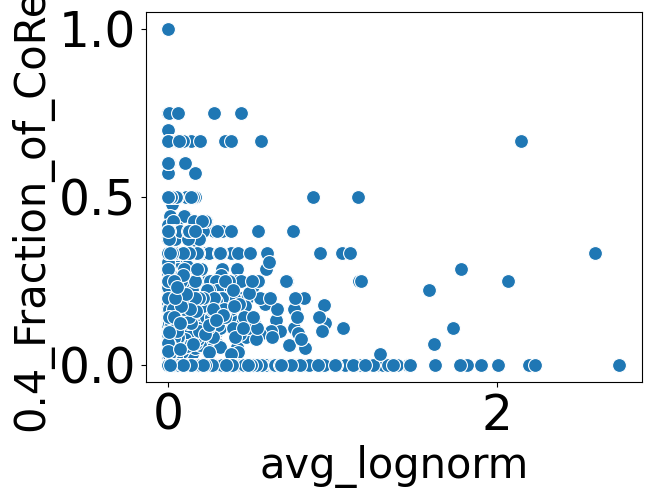

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

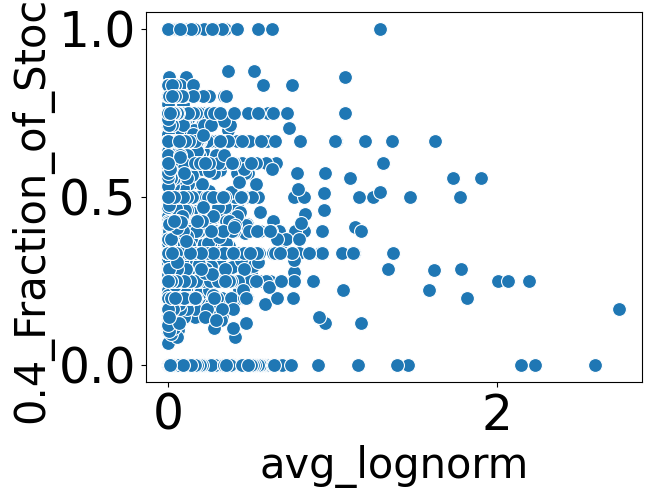

In [74]:

sns.scatterplot(data=ad.var,y='0.4_Fraction_of_Random', x='avg_lognorm')
plt.show()
sns.scatterplot(data=ad.var,y='0.4_Fraction_of_CoReg', x='avg_lognorm')
plt.show()
sns.scatterplot(data=ad.var,y='0.4_Fraction_of_Stoch', x='avg_lognorm')
plt.show()

In [75]:

# sns.scatterplot(data=ad_coreg.var,y='0.4_Fraction_of_CoReg', x='avg_lognorm')
# plt.show()
# sns.scatterplot(data=ad_coreg.var,y='0.4_Fraction_of_Random', x='avg_lognorm')
# plt.show()
# sns.scatterplot(data=ad_coreg.var,y='0.4_Fraction_of_Stoch', x='avg_lognorm')
# plt.show()

In [76]:
ad_coreg.obs

,Run,Assay Type,AvgSpotLen,Bases,BioProject,BioSample,Bytes,Center Name,Consent,DATASTORE filetype,...,Platform_y,Series,Supplementary Types,Supplementary Links,SRA Accession,Contact,Release Date,Nfkbia,Nfkbib,Ubl3
Y4_TA_Hi_11,SRR8067241,RNA-Seq,150,107484600,PRJNA497128,SAMN10250014,41604327,GEO,public,"sra,fastq",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895580,Felix Krueger,"Aug 14, 2019",9.004555,0.000000,0.000000
Y4_TA_Hi_12,SRR8067242,RNA-Seq,150,90305850,PRJNA497128,SAMN10250013,35342837,GEO,public,"sra,fastq",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895581,Felix Krueger,"Aug 14, 2019",9.096247,0.000000,6.647812
Y4_TA_Hi_13,SRR8067243,RNA-Seq,150,97244550,PRJNA497128,SAMN10250012,37644383,GEO,public,"fastq,sra",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895582,Felix Krueger,"Aug 14, 2019",8.992454,5.921165,7.264466
Y4_TA_Hi_1,SRR8067250,RNA-Seq,150,39392850,PRJNA497128,SAMN10250005,15256244,GEO,public,"fastq,sra",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895589,Felix Krueger,"Aug 14, 2019",8.648481,0.000000,8.355193
Y4_TA_Hi_23,SRR8067254,RNA-Seq,150,116119050,PRJNA497128,SAMN10250001,45741310,GEO,public,"sra,fastq",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895593,Felix Krueger,"Aug 14, 2019",8.470882,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
O5_TA_Hi_90,SRR8067040,RNA-Seq,150,105824700,PRJNA497128,SAMN10249402,38171506,GEO,public,"fastq,sra",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895379,Felix Krueger,"Aug 14, 2019",8.410683,0.000000,0.000000
O5_TA_Hi_91,SRR8067041,RNA-Seq,150,107854050,PRJNA497128,SAMN10249401,38724795,GEO,public,"fastq,sra",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895380,Felix Krueger,"Aug 14, 2019",8.482795,7.241049,0.000000
O5_TA_Hi_92,SRR8067042,RNA-Seq,150,64730850,PRJNA497128,SAMN10249400,22913257,GEO,public,"fastq,sra",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895381,Felix Krueger,"Aug 14, 2019",8.681867,0.000000,0.000000
O5_TA_Hi_94,SRR8067044,RNA-Seq,150,158993700,PRJNA497128,SAMN10249398,58439965,GEO,public,"sra,fastq",...,GPL17021,GSE121364;GSE121437,SRA Run Selector,https://www.ncbi.nlm.nih.gov/Traces/study/?acc...,SRX4895383,Felix Krueger,"Aug 14, 2019",9.165720,0.000000,5.552847


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


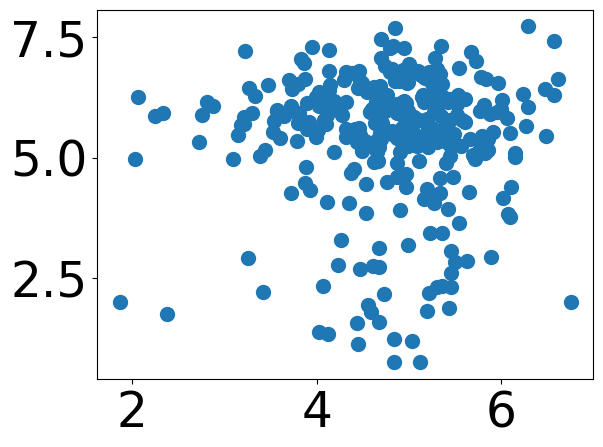

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


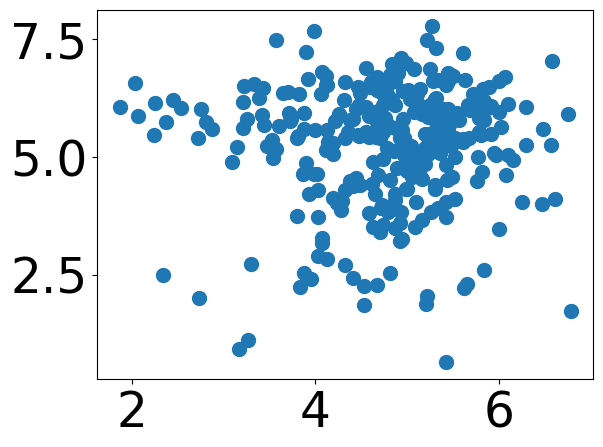

In [77]:
high_genes = ['Rps18', 'Litaf', 'Actn4', 'Runx1', 'Ctsz'] 
plt.scatter(ad_stoch[:,high_genes[0]].X, ad_stoch[:,high_genes[1]].X)
plt.show()

plt.scatter(ad_stoch[:,high_genes[0]].X, ad_stoch[:,high_genes[2]].X)
plt.show()

In [78]:
typ = 'plus'
# typ = 'minus'
if typ == 'plus':
    # file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', overwrite=True)
    
else:
    # file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx',overwrite=True)
    
df_real = pd.read_excel(file, header=[0,1,2,3])
df_sur = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)

2024-01-24 07:21:02.127 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', checksum='adr4JysTrgn/AoKlRZnqcQ==')


In [79]:
typ = 'plus'
# typ = 'minus'
if typ == 'plus':
    # file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', overwrite=True)
    
else:
    # file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx', overwrite=True)
    
df_real_pl = pd.read_excel(file, header=[0,1,2,3])
df_sur_pl = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)

2024-01-24 07:21:03.363 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', checksum='adr4JysTrgn/AoKlRZnqcQ==')


In [80]:
# typ = 'plus'
typ = 'minus'
if typ == 'plus':
    # file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', overwrite=True)
    
else:
    # file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx', overwrite=True)
    
    
df_real_mi = pd.read_excel(file, header=[0,1,2,3])
df_sur_mi = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)

2024-01-24 07:21:04.277 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx', checksum='fpEa2SFEFbxBcPIx0axxMA==')


In [81]:
def convert_table(df_t, th, kind, group='r'):
    df_tmp = df_t[f'TH={th}'][f'{kind2name[kind]}']
    df_tmp.columns = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
    df = pd.DataFrame(df_tmp.values.flatten())
    df['Mouse'] = np.array([[x] * df_tmp.shape[0] for x in df_tmp.columns]).flatten()
    df.columns = ['GCL', 'Mouse']
    df['Mouse_ID'] = df['Mouse'].apply(lambda x: f'{x}_{group}')
    group2name = {'r': 'Real',
                  's': 'Surrogate'}
    df['Group'] = group2name[group]
    df['Kind'] = kind2name[kind]
    df['Th'] = th
    return df.copy()

In [82]:
def normalize_table(df_t, df_base, th, kind, group='r'):
    df_tmp = df_t[f'TH={th}'][f'{kind2name[kind]}']
    df_norm = df_base[f'TH={th}'][f'{kind2name[kind]}']
    df_tmp.columns = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
    df_norm.columns = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
    means = df_norm.mean(axis=0)
    stds = df_norm.std(axis=0)
    df_tmp -= means
    df_tmp /= stds

    df = pd.DataFrame(df_tmp.values.flatten())
    df['Mouse'] = np.array([[x] * df_tmp.shape[0] for x in df_tmp.columns]).flatten()
    df.columns = ['GCL', 'Mouse']
    df['Mouse_ID'] = df['Mouse'].apply(lambda x: f'{x}_{group}')
    df['Group'] = group
    df['Kind'] = kind2name[kind]
    df['Th'] = th
    mouse2age = {'O1':'Old',
                 'O5':'Old',
                 'Y4':'Young',
                 'Y5':'Young',
                 'Y7':'Young',
                 'Y8':'Young'}
    df['Age'] = df['Mouse'].apply(lambda x: mouse2age[x])
    return df.copy()

# Both strands

In [83]:
typ = 'plus'
# typ = 'minus'
if typ == 'plus':
    # file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', overwrite=True)
    
else:
    # file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx', overwrite=True)
    
df_real_pl = pd.read_excel(file, header=[0,1,2,3])
df_sur_pl = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)
# typ = 'plus'
typ = 'minus'
if typ == 'plus':
    # file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', overwrite=True)
    
else:
    # file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'
    file = sct.io.uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx', overwrite=True)
    
df_real_mi = pd.read_excel(file, header=[0,1,2,3])
df_sur_mi = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)

2024-01-24 07:21:05.209 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_PlusStrand1cpg.xlsx', checksum='adr4JysTrgn/AoKlRZnqcQ==')


2024-01-24 07:21:06.196 | ℹ️ You can now replace your function call with the following for reproducibility:
uget('gs://retro-personal-andrei/scDNAm/scDNAm/For_Orr/TableForAndrei_MinusStrand1cpg.xlsx', checksum='fpEa2SFEFbxBcPIx0axxMA==')


plus
coreg


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

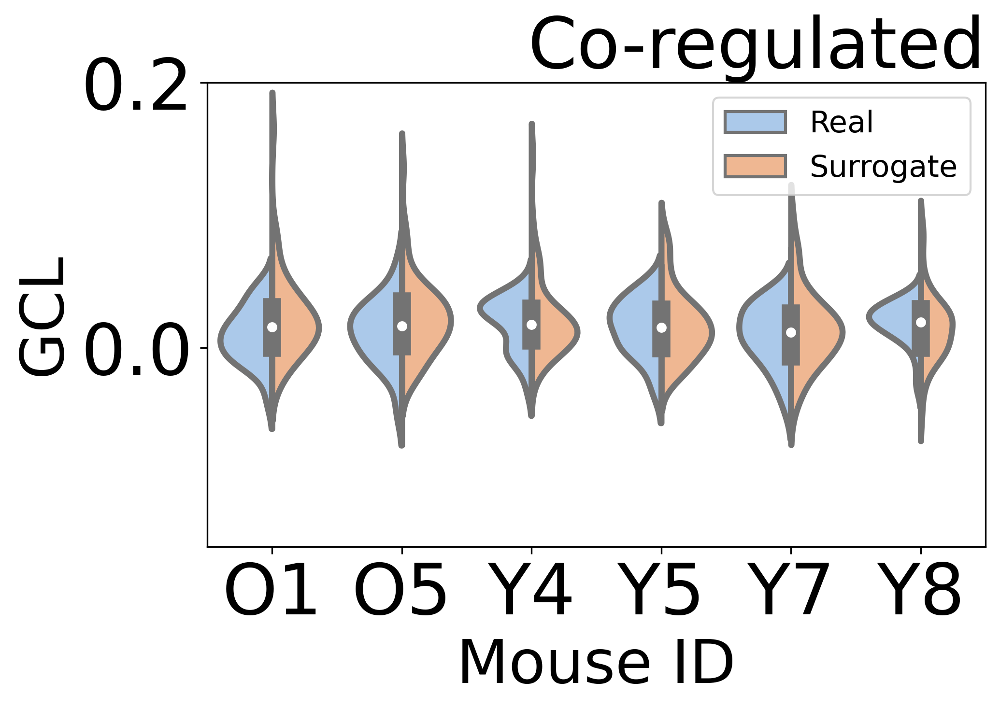

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


stoch


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

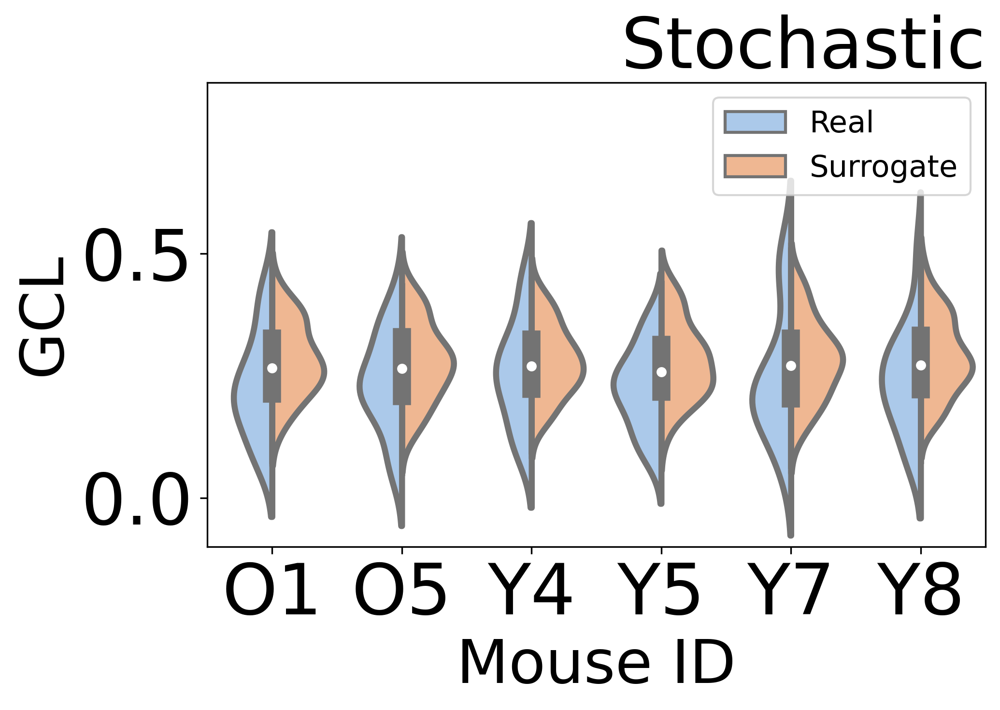

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


rand


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

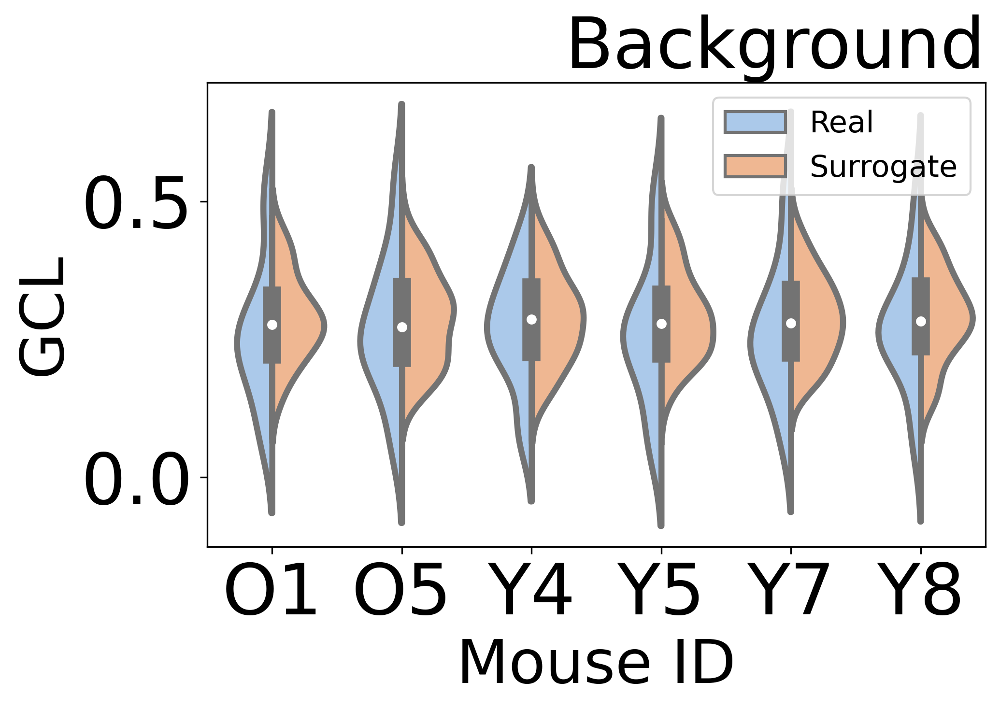

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


minus
coreg


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

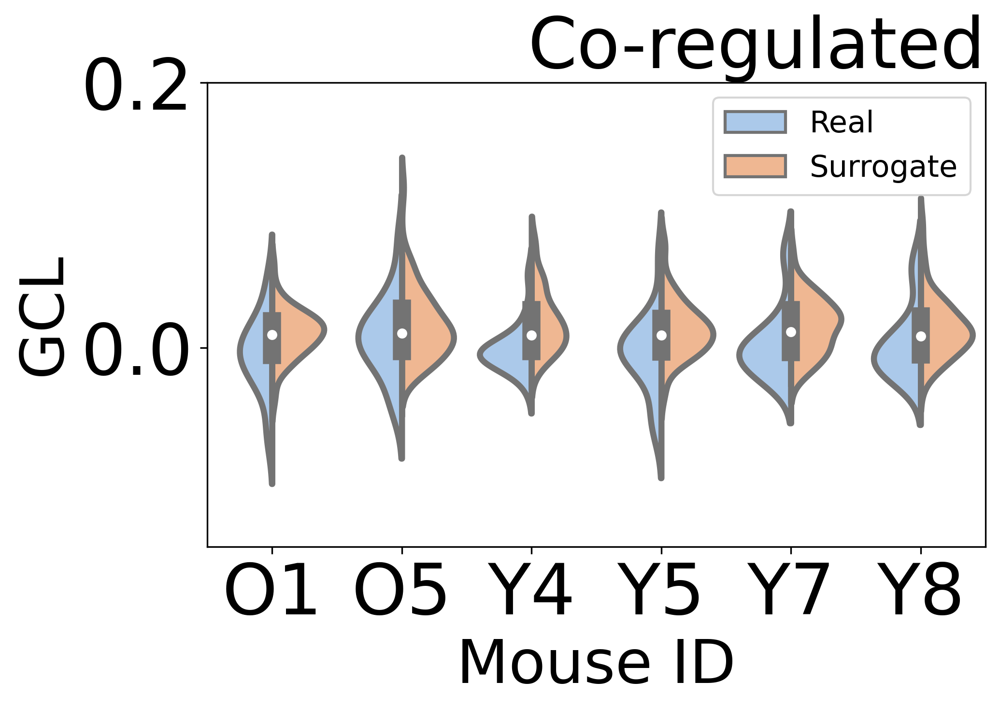

stoch


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

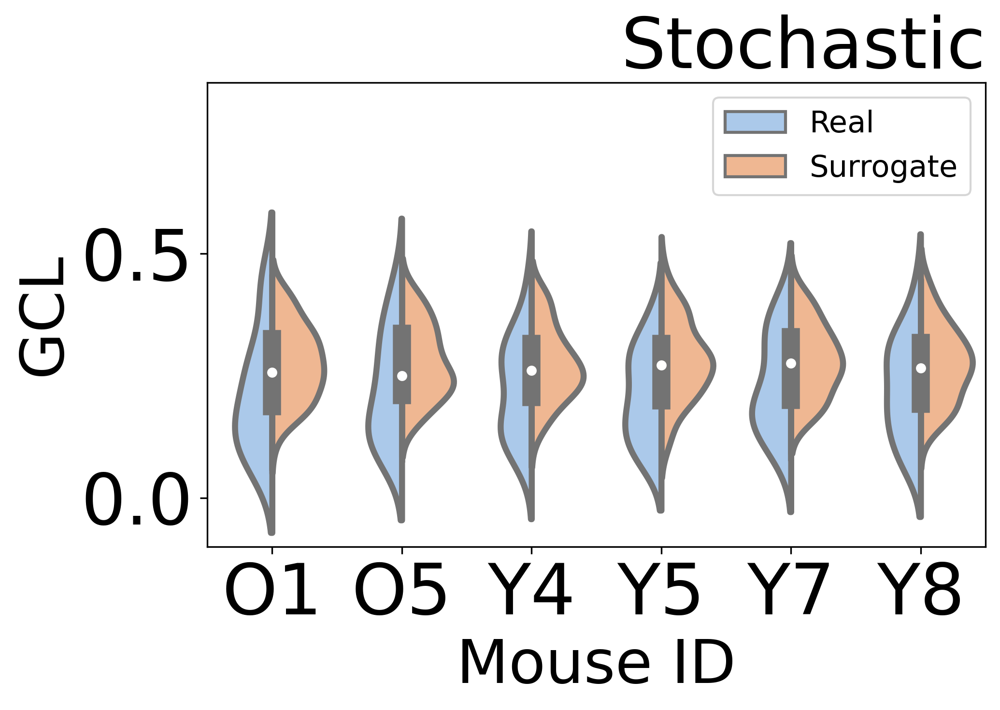

findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.


rand


findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font family 'Arial' not found.
findfont: Font f

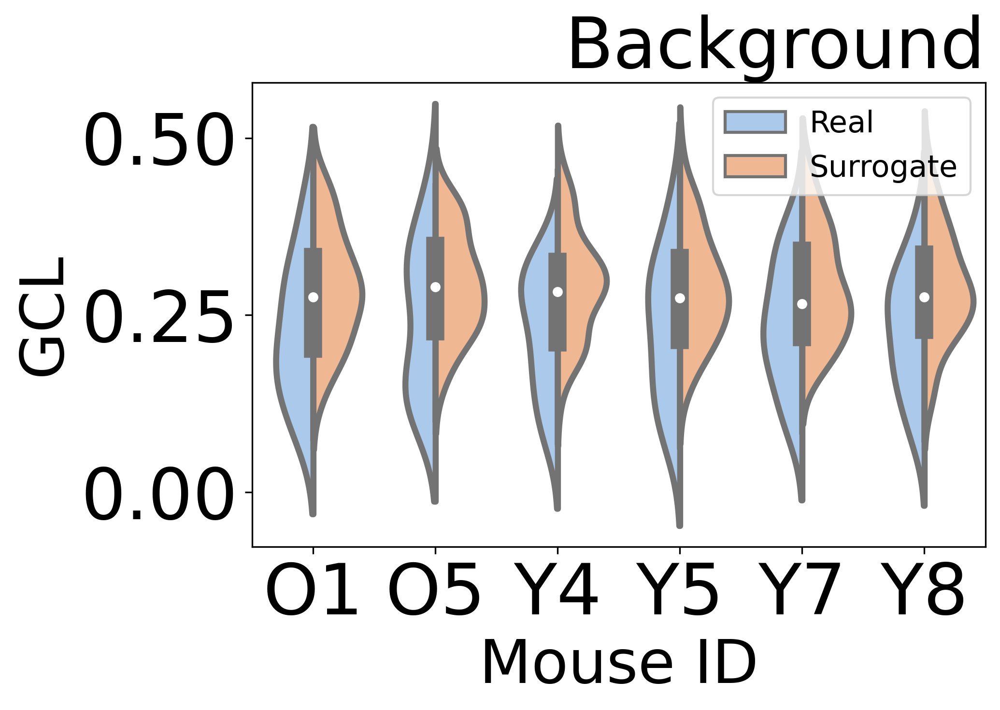

In [84]:
# import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
# plt.style.use('../Stochastic aging/pics/meth.mplstyle')
plt.style.use('meth.mplstyle')
# plt.figure(figsize=(7,7), dpi=300)


th, kind = 0.4, 'coreg'
kind2name = {'coreg': 'CoReggenesGCL',
        'stoch': 'StochgenesGCL',
        'rand': 'RandomgenesGCL'}


group2name = {'coreg' : 'Co-regulated',
        'stoch' : 'Stochastic',
    'rand': 'Background'}
mice = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
ths = [0.4, 0.5, 0.6]
kinds = ['coreg', 'stoch', 'rand']
x = 'Mouse'
# x = 'Mouse_ID'
y = 'GCL'
order = mice
order = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
# tests = ['t-test-ind']#, 't-test_welch', 't-test_paired', 'Mann-Whitney', 'Mann-Whitney-gt', 'Mann-Whitney-ls', 'Levene', 'Wilcoxon', 'Kruskal']
tests = ['Mann-Whitney']#, 't-test_welch', 't-test_paired', 'Mann-Whitney', 'Mann-Whitney-gt', 'Mann-Whitney-ls', 'Levene', 'Wilcoxon', 'Kruskal']
# box_pairs = [('O1_r', 'O1_s'), ('O5_r','O5_s'), ('Y4_r','Y4_s'), ('Y5_r','Y5_s'), ('Y7_r','Y7_s'), ('Y8_r', 'Y8_s')]
box_pairs=[(order[x],order[y]) for x in range(0, len(order)) for y in range(x+1, len(order))]
test = tests[0]
for th in [0.5]:#ths:
    for strand in ['plus', 'minus']:
        print(strand)
        for kind in kinds:
            print(kind)
            df_r_pl = convert_table(df_real_pl, th, kind, group='r')
            df_s_pl = convert_table(df_sur_pl, th, kind, group='s')
            df_r_mi = convert_table(df_real_mi, th, kind, group='r')
            df_s_mi = convert_table(df_sur_mi, th, kind, group='s')
            if strand == 'plus':
                df_t = pd.concat((df_r_pl,df_s_pl), axis=0)
            elif strand == 'minus':
                df_t = pd.concat((df_r_mi,df_s_mi), axis=0)
            fig, ax = plt.subplots(1,1, figsize=(7,5),dpi=300)
            ax = sns.violinplot(data=df_t, x=x, y=y, hue='Group', order=order, fontsize=50, ax=ax, split=True,
                               palette='pastel')
            ax.set_title(group2name[kind], loc='right')
            plt.xlabel(None)
            plt.ylabel('GCL')
            plt.legend(loc='upper right', fontsize=15)
            # plt.xlim([0,8])
            if kind == 'stoch':
                plt.ylim([-0.1, 0.85])
            elif kind == 'coreg':
                plt.ylim([-0.15, 0.2])
                
            plt.xlabel('Mouse ID')
            plt.tight_layout()
            plt.savefig(f'../scDNAm/PICS/png/GCL_raw_{strand}_strand_normalized_by_mouse_{x}_{y}_{test}_{th}_{kind}.png', format='png', dpi=300)
            plt.show()

# Plus by mouse

In [85]:
typ = 'plus'
# typ = 'minus'
if typ == 'plus':
    file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
else:
    file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'

df_real = pd.read_excel(file, header=[0,1,2,3])
df_sur = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)

FileNotFoundError: [Errno 2] No such file or directory: 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'

In [ ]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.style.use('../Stochastic aging/pics/meth.mplstyle')
plt.figure(figsize=(7,7), dpi=300)


th, kind = 0.4, 'coreg'
kind2name = {'coreg': 'CoReggenesGCL',
        'stoch': 'StochgenesGCL',
        'rand': 'RandomgenesGCL'}

group2name = {'CoReggenesGCL' : 'Co-regulated',
        'StochgenesGCL' : 'Stochastic',
    'RandomgenesGCL': 'Background'}

mice = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
ths = [0.4, 0.5, 0.6]
kinds = ['coreg', 'stoch', 'rand']

order = ['Co-regulated', 'Stochastic', 'Background']
# x = 'Mouse'
x = 'Kind'
# x = 'Mouse_ID'
y = 'GCL'
order = mice
order = ['Co-regulated', 'Stochastic']
tests = ['Mann-Whitney']
box_pairs=[(order[x],order[y]) for x in range(0, len(order)) for y in range(x+1, len(order))]

for th in ths:
    for test in tests:
        # for kind in kinds:
        for mouse in mice:
            df_t = pd.concat((normalize_table(df_real, df_sur, th, kind, group='r') for kind in kinds), axis=0)
            df_t = df_t[df_t.Mouse == mouse]
            df_t['Kind'] = df_t['Kind'].apply(lambda x: group2name[x])
            print(mouse)
            print(df_t['Kind'].value_counts())
            fig, ax = plt.subplots(1,1, figsize=(7,7),dpi=300)
            palette = 'Greens' if mouse in ['Y4','Y5', 'Y7', 'Y8'] else 'Reds'
            ax = sns.violinplot(data=df_t, x=x, y=y, order=order, fontsize=50,ax=ax, 
                                palette=palette,
                                title=mouse)
            annotator = Annotator(ax, box_pairs, data=df_t, x=x, y=y, order=order,
                                 )
            annotator.configure(test=test, 
                                #test='Wilcoxon-legacy',
                                text_format='star', 
                                # text_format='simple', 
                                loc='outside',
                                # loc='inside',
                                verbose=0, 
                                fontsize=25)
                                # fontsize=25)
            annotator.apply_and_annotate()
            ax.set_title(mouse, loc='right')
            plt.xlabel(None)
            
            plt.ylabel('z-score of GCL')
            plt.xticks(fontsize=25, rotation=0)
            plt.savefig(f'../scDNAm/PICS/png/GCL_plus_strand_normalized_by_mouse_{x}_{y}_{test}_{th}_{mouse}.png', format='png', dpi=300)
            plt.show()

# Minus by mouse

In [ ]:
# typ = 'plus'
typ = 'minus'
if typ == 'plus':
    file = 'For_Orr/TableForAndrei_PlusStrand1cpg.xlsx'
else:
    file = 'For_Orr/TableForAndrei_MinusStrand1cpg.xlsx'
    
df_real = pd.read_excel(file, header=[0,1,2,3])
df_sur = pd.read_excel(file, header=[0,1,2,3], sheet_name=1)

In [ ]:
import matplotlib
matplotlib.rcParams.update(matplotlib.rcParamsDefault)
plt.style.use('../Stochastic aging/pics/meth.mplstyle')
plt.figure(figsize=(7,7), dpi=300)


th, kind = 0.4, 'coreg'
kind2name = {'coreg': 'CoReggenesGCL',
        'stoch': 'StochgenesGCL',
        'rand': 'RandomgenesGCL'}

group2name = {'CoReggenesGCL' : 'Co-regulated',
        'StochgenesGCL' : 'Stochastic',
    'RandomgenesGCL': 'Background'}

mice = ['O1', 'O5', 'Y4', 'Y5', 'Y7', 'Y8']
ths = [0.4, 0.5, 0.6]
kinds = ['coreg', 'stoch', 'rand']
# x = 'Mouse'
x = 'Kind'
# x = 'Mouse_ID'
y = 'GCL'
order = mice
order = ['Co-regulated', 'Stochastic']
tests = ['Mann-Whitney']
box_pairs=[(order[x],order[y]) for x in range(0, len(order)) for y in range(x+1, len(order))]

for th in ths:
    for test in tests:
        # for kind in kinds:
        for mouse in mice:
            df_t = pd.concat((normalize_table(df_real, df_sur, th, kind, group='r') for kind in kinds), axis=0)
            df_t = df_t[df_t.Mouse == mouse]
            df_t['Kind'] = df_t['Kind'].apply(lambda x: group2name[x])
            print(mouse)
            print(df_t['Kind'].value_counts())
            fig, ax = plt.subplots(1,1, figsize=(7,7),dpi=300)
            palette = 'Greens' if mouse in ['Y4','Y5', 'Y7', 'Y8'] else 'Reds'
            ax = sns.violinplot(data=df_t, x=x, y=y, order=order, fontsize=50,ax=ax, 
                                palette=palette,
                                title=mouse)
            annotator = Annotator(ax, box_pairs, data=df_t, x=x, y=y, order=order,
                                 )
            annotator.configure(test=test, 
                                text_format='star', 
                                loc='outside',
                                # loc='inside',
                                verbose=0, 
                                fontsize=25)
                                # fontsize=25)
            annotator.apply_and_annotate()
            ax.set_title(mouse, loc='right')
            plt.xlabel(None)
            plt.ylabel('z-score of GCL')
            plt.xticks(fontsize=25, rotation=0)
            plt.savefig(f'../scDNAm/PICS/png/GCL_minus_strand_normalized_by_mouse_{x}_{y}_{test}_{th}_{mouse}.png', format='png', dpi=300)
            plt.show()